# How to Get 97% Accuracy on the German Traffic Signs Validation Dataset

___
## First load the data

In [1]:
# Import pickle files of train, validation, and test sets:
import pickle
import numpy as np
import pandas as pd

training_file = 'traffic-signs-data/train.p'
validation_file = 'traffic-signs-data/valid.p'
testing_file = 'traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(validation_file, mode='rb') as f:
    valid = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_valid, y_valid = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']

# Load sign names:
sign_names = pd.read_csv('signnames.csv')[['ClassId', 'SignName']].values

# Save original sizes and bounding-box coordinates (this will help during preprocessing):
train_sizes= train['sizes']
train_coord = train['coords']

valid_sizes= valid['sizes']
valid_coord = valid['coords']

test_sizes= test['sizes']
test_coord = test['coords']

## Let's take a look at the basics

In [2]:
n_train = X_train.shape[0]
n_validation = X_valid.shape[0]
n_test = X_test.shape[0]
image_shape = X_train.shape[1:]
n_classes = len(np.unique(y_train))

print("Number of training examples =", n_train)
print("Number of validation examples =", n_validation)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 34799
Number of validation examples = 4410
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


## Now let's check out the distribution of classes for each set
I like looking at the numbers rather than a graph. I find it easier to ingest the information, so that's what I'll do.

In [3]:
a, b = np.unique(y_train, return_counts=True)
print('Training Data:')
for i in range(len(a)):
    print('{:.20} occurs {} times or {:.0f}% of total'.format(sign_names[a[i], 1], b[i], (b[i]/np.sum(b))*100))
print('')
a, b = np.unique(y_valid, return_counts=True)
print('Validation Data:')
for i in range(len(a)):
    print('{:.20} occurs {} times or {:.0f}% of total'.format(sign_names[a[i], 1], b[i], (b[i]/np.sum(b))*100))
print('')  
a, b = np.unique(y_test, return_counts=True)
print('Test Data:')
for i in range(len(a)):
    print('{:.30} occurs {} times or {:.0f}% of total'.format(sign_names[a[i], 1], b[i], (b[i]/np.sum(b))*100))

Training Data:
Speed limit (20km/h) occurs 180 times or 1% of total
Speed limit (30km/h) occurs 1980 times or 6% of total
Speed limit (50km/h) occurs 2010 times or 6% of total
Speed limit (60km/h) occurs 1260 times or 4% of total
Speed limit (70km/h) occurs 1770 times or 5% of total
Speed limit (80km/h) occurs 1650 times or 5% of total
End of speed limit ( occurs 360 times or 1% of total
Speed limit (100km/h occurs 1290 times or 4% of total
Speed limit (120km/h occurs 1260 times or 4% of total
No passing occurs 1320 times or 4% of total
No passing for vehic occurs 1800 times or 5% of total
Right-of-way at the  occurs 1170 times or 3% of total
Priority road occurs 1890 times or 5% of total
Yield occurs 1920 times or 6% of total
Stop occurs 690 times or 2% of total
No vehicles occurs 540 times or 2% of total
Vehicles over 3.5 me occurs 360 times or 1% of total
No entry occurs 990 times or 3% of total
General caution occurs 1080 times or 3% of total
Dangerous curve to t occurs 180 times o

Nothing too surprising. The distributions look similar. In all three sets, some signs occur more than others. Some of the notable ones are speed-limit, priority road, and yield signs.

## Time to look at actual signs
I'll start by printing 80 random signs from each set.

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

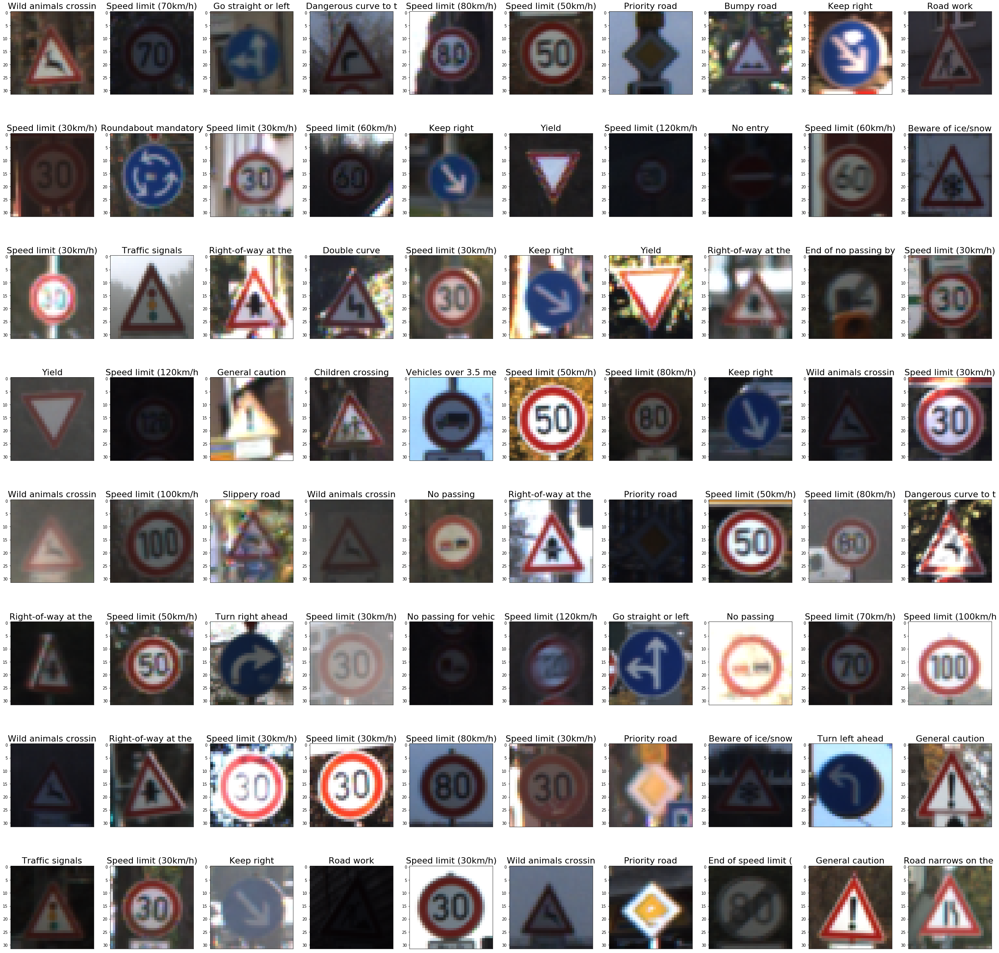

In [5]:
ii = 1
idx = np.arange(n_train)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.20}'.format(sign_names[y_train[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(X_train[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

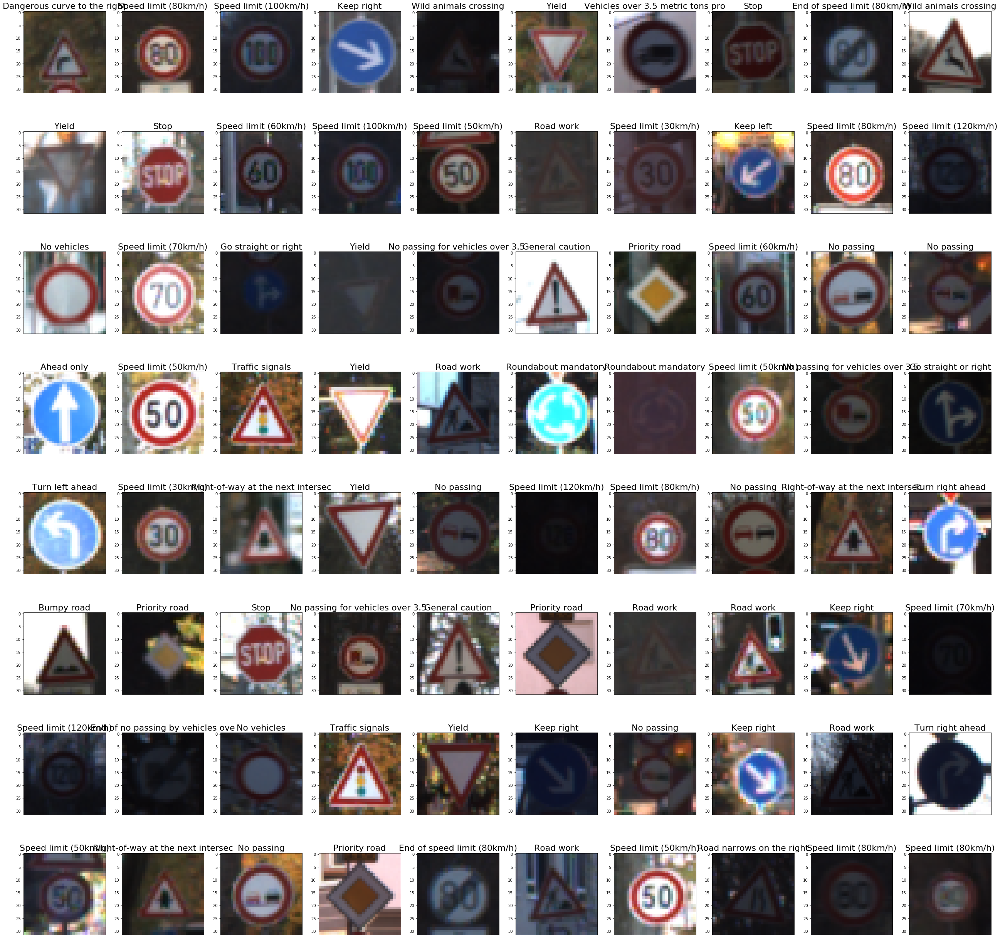

In [6]:
ii = 1
idx = np.arange(n_validation)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.33}'.format(sign_names[y_valid[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(X_valid[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

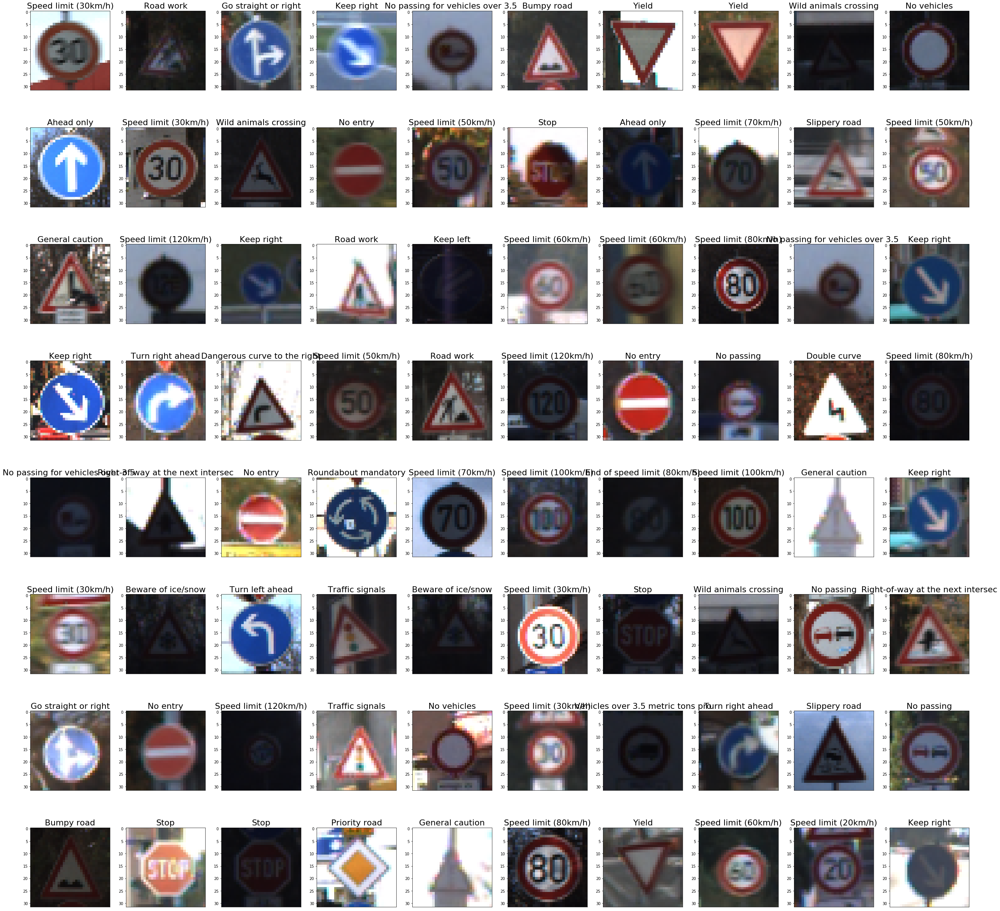

In [7]:
ii = 1
idx = np.arange(n_test)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.33}'.format(sign_names[y_test[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(X_test[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## There are lots of repeats in the training set . . .

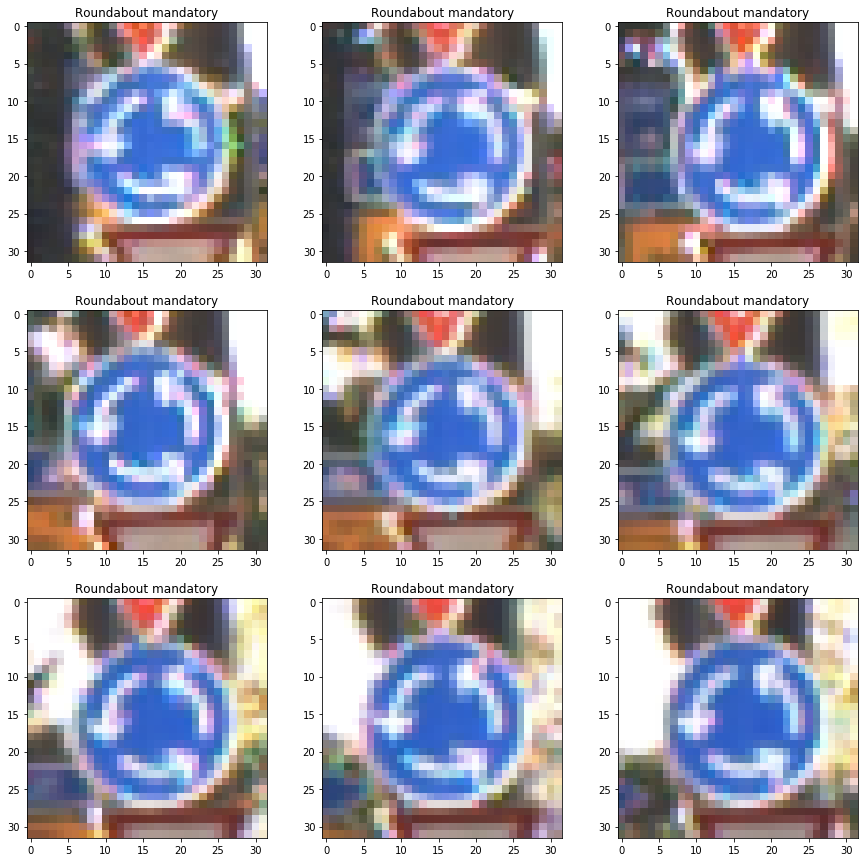

In [8]:
plt.figure(figsize=(15,15))
for i in range(9):
    plt.subplot(3,3,(i+1))
    plt.imshow(X_train[4200+i])
    plt.title(sign_names[y_train[4200+i], 1])

## . . . as well as in the validation set

As it happens, the below sign was the most misclassified sign for a network that I ran for 200 epochs and achieved a validation accuracy over 95%. Too bad it repeats many times within the validaiton set, so the one mistake counts as 10+ mistakes :(

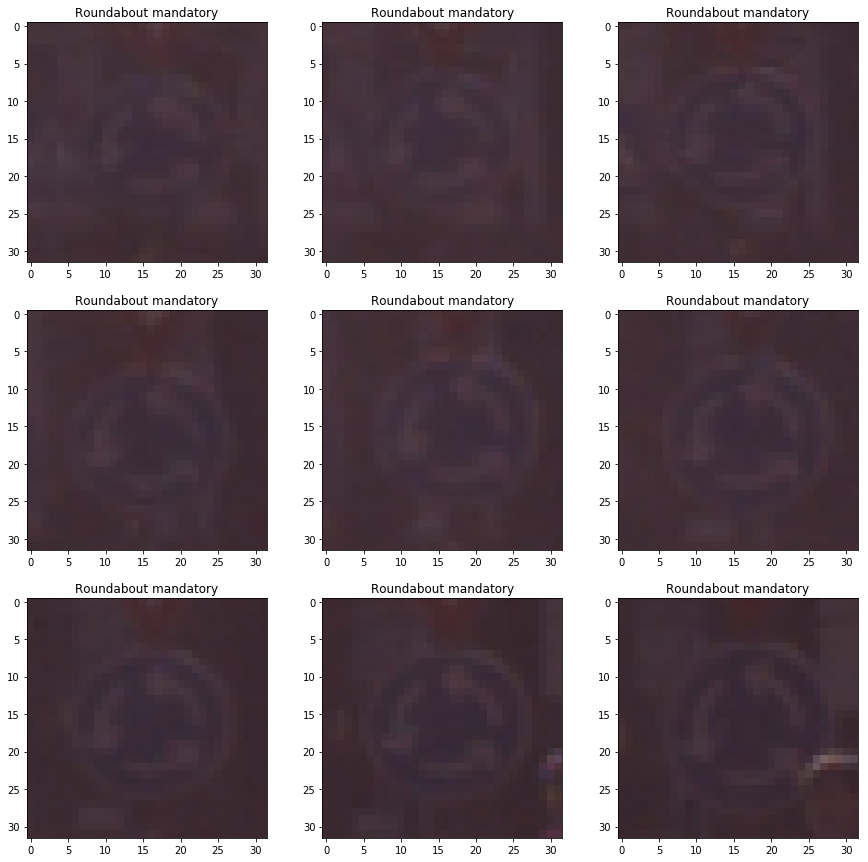

In [9]:
plt.figure(figsize=(15,15))
for i in range(9):
    plt.subplot(3,3,(i+1))
    plt.imshow(X_valid[540+i])
    plt.title(sign_names[y_valid[540+i], 1])

## How to preprocess the data?
The first five functions augment the training data and are not applied during test time on the validation or test sets. They are applied randomly to each image in each batch so the network never sees the exact same image twice, even if there are repeats :) 
    
**random_blur:** Applies a Gaussian Noise kernel 50% of time
    
**random_brighten:** After noticing that signs in all sets had varying degrees of brightness, which didn't seem to be related to natural light conditions, I used this to randomly brighten or darken an image in a way to resemble images in the validation and test sets. I found out about OpenCV's lookup table from [this tutorial](http://www.pyimagesearch.com/2015/10/05/opencv-gamma-correction/).

**random_red_adjust:** This is poorly named because it adjusts all three color channels. It started out only affecting the red channel, but seemed to help the network generalize, so evolved.

**random_rotate:** Self-explanatory. I don't flip images and only rotate them by a max of 40 degrees because certain signs, like Left Turn Ahead and speed-limit signs, would confuse the network if flipped.

**random_crop:** Self-explanatory.

The only preprocessing normalization is to scale the data between 0 and 1.

Since bounding boxes are included, every image is cropped to include only the region within the box and resized to 32x32x3 for uniformity.

Images are kept in color because networks trained on RGB-images performed better for me than those on grayscale. Intuitively, this makes sense because street signs are designed to be different in three ways: shape, images and/or text, and color. 

In [10]:
import cv2
import matplotlib.image as mpimg

In [11]:
def random_blur(x, kernel_size=3):
    blur = np.random.randint(1,3)
    if blur == 1:
        return cv2.GaussianBlur(x, (kernel_size, kernel_size), 0)
    if blur == 2:
        return x
    
def random_brighten(x):
    dark = np.random.randint(1,3)
    if dark == 1:
        gamma = np.random.random() * 0.7 + 0.3
    if dark == 2:
        gamma = np.random.random() * 3.5 + 1.1
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(x, table)

def random_red_adjust(x):    
    R = np.random.random() * 0.3 + 0.7
    G = np.random.random() * 0.3 + 0.7
    B = np.random.random() * 0.3 + 0.7
    x[:,:,0] *= R
    x[:,:,1] *= G
    x[:,:,2] *= B
    return x

def random_rotate(x):
    degrees = int((np.random.rand() * 80) - 40)
    rows = x.shape[0]
    cols = x.shape[1]
    M = cv2.getRotationMatrix2D((cols/2,rows/2),degrees,1)
    dst = cv2.warpAffine(x,M,(cols,rows))
    return dst

def random_crop(x):
    n = int(x.shape[0] * 0.2)
    m = int(x.shape[1] * 0.2)
    x1 = np.random.randint(n)
    x2 = np.random.randint(n)
    y1 = np.random.randint(m)
    y2 = np.random.randint(m)
    crop = x[x1:x.shape[1]-x2, y1:x.shape[1]-y2]
    out = cv2.resize(crop, dsize=(32,32))
    return out

def normalize(x):
    return x / 255.

def region_of_interest_train(images, sizes, coords):
    # the reason for the try statement is to ignore illogical bounding boxes or images lacking them
    # the reason for the two if statements is to distinguish between inputs of batch_size and one image
    images_roi = []
    if len(images.shape) == 4:
        for i in range(images.shape[0]):
            try:
                orig_shape = images[i].shape
                resize = cv2.resize(images[i], dsize=tuple(sizes[i]))
                crop = resize[coords[i][0]:coords[i][2], coords[i][1]:coords[i][3], :]
                rand_crop = random_crop(crop)
                rand_bri = random_brighten(rand_crop)
                rand_rot = random_rotate(rand_bri)
                rand_blu = random_blur(rand_rot)
                resize2 = cv2.resize(rand_blu, dsize=tuple(orig_shape[:2]))
                norm = normalize(resize2)
                out = random_red_adjust(norm)
                images_roi.append(out)
            except:
                images_roi.append(normalize(images[i]))
                
    if len(images.shape) == 3:
        orig_shape = images.shape
        resize = cv2.resize(images, dsize=tuple(sizes))
        crop = resize[coords[0]:coords[2], coords[1]:coords[3], :]
        rand_crop = random_crop(crop)
        rand_bri = random_brighten(rand_crop)
        rand_rot = random_rotate(rand_bri)
        rand_blu = random_blur(rand_rot)
        resize2 = cv2.resize(rand_blu, dsize=tuple(orig_shape[:2]))
        norm = normalize(resize2)
        out = random_red_adjust(norm)
        images_roi.append(out)
    return np.array(images_roi)

def get_batches_train(images, labels, sign_names, sizes, coords, batch_num):
    num_images = len(images)
    idx = np.arange(num_images)
    np.random.shuffle(idx)
    for i in range(0, num_images, batch_num):
        batch_y = labels[idx[i:i+batch_num]]
        batch_sizes = sizes[idx[i:i+batch_num]]
        batch_coords = coords[idx[i:i+batch_num]]
        batch_names = sign_names[batch_y, 1]
        images_x = images[idx[i:i+batch_num]]
        batch_x = region_of_interest_train(images_x, batch_sizes, batch_coords).reshape((-1, 32, 32, 3))
        yield batch_x, batch_y, batch_names, batch_sizes, batch_coords

# Seperate get_batches and region_of_interest for test and validation without data augmentation
def region_of_interest_test(images, sizes, coords):
    images_roi = []
    if len(images.shape) == 4:
        for i in range(images.shape[0]):
            try:
                orig_shape = images[i].shape
                resize = cv2.resize(images[i], dsize=tuple(sizes[i]))
                crop = resize[coords[i][0]:coords[i][2], coords[i][1]:coords[i][3], :]
                out = cv2.resize(crop, dsize=tuple(orig_shape[:2]))
                images_roi.append(normalize(out))
            except:
                images_roi.append(normalize(images[i]))
                
    if len(images.shape) == 3:
        orig_shape = images.shape
        resize = cv2.resize(images, dsize=tuple(sizes))
        crop = resize[coords[0]:coords[2], coords[1]:coords[3], :]
        out = cv2.resize(crop, dsize=tuple(orig_shape[:2]))
        images_roi.append(normalize(out))
    return np.array(images_roi)

def get_batches_test(images, labels, sign_names, sizes, coords, batch_num):
    num_images = len(images)
    for i in range(0, num_images, batch_num):
        idx = np.arange(i,i+batch_num)
        batch_y = labels[i:i+batch_num]
        batch_sizes = sizes[i:i+batch_num]
        batch_coords = coords[i:i+batch_num]
        batch_names = sign_names[batch_y, 1]
        images_x = images[i:i+batch_num]
        batch_x = region_of_interest_test(images_x, batch_sizes, batch_coords).reshape((-1, 32, 32, 3))
        yield idx, batch_x, batch_y, batch_names, batch_sizes, batch_coords

## Here's what one image looks like when preprocessed eight times

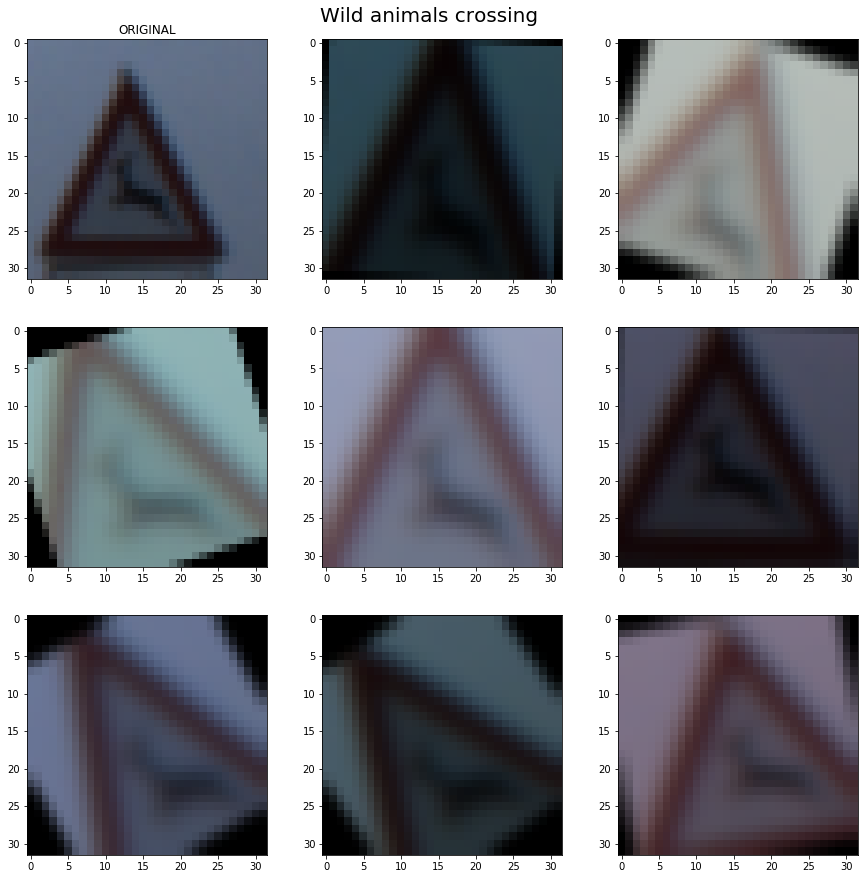

In [12]:
x = X_train[267]
y = y_train[267]
x_name = sign_names[y]
x_coord = train_coord[267]
x_size = train_sizes[267]
x_resize = cv2.resize(x, dsize=tuple(x_size))
plt.figure(figsize=((15,15)))
plt.suptitle(x_name[1], fontsize=20, y=0.91)
plt.subplot(3,3,1)
plt.title('ORIGINAL')
plt.imshow(x)
for i in range(2,10):
    plt.subplot(3,3,i)
    plt.imshow(region_of_interest_train(x, x_size, x_coord).reshape((32,32,3)))

## Now compare 10 images from each set before and after preprocessing
Only the train images are randomly augmented, but we'll look at all three sets to make sure everything works properly.

In [13]:
train_roi = region_of_interest_train(X_train, train_sizes, train_coord)
valid_roi = region_of_interest_test(X_valid, valid_sizes, valid_coord)
test_roi = region_of_interest_test(X_test, test_sizes, test_coord)

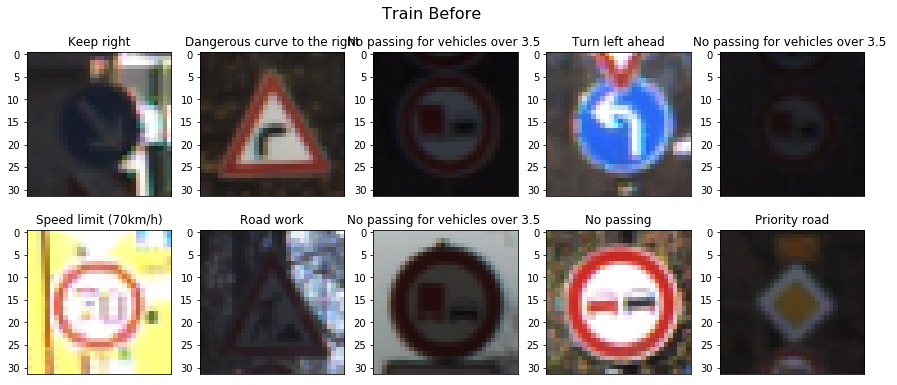

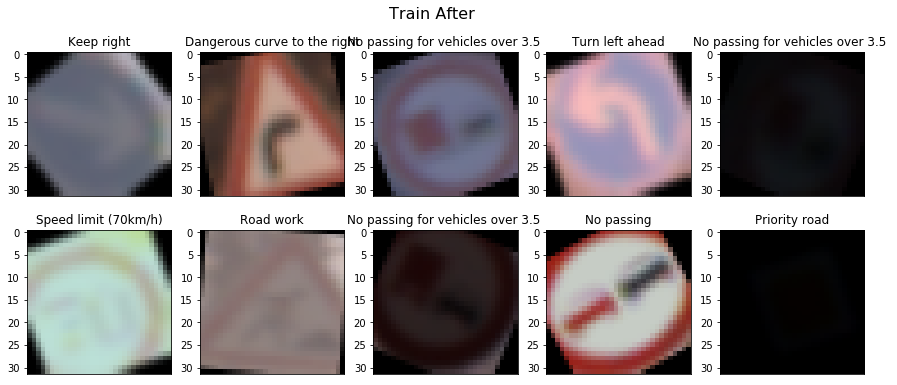

In [14]:
ii = 3
idx = np.arange(n_train)
np.random.shuffle(idx)
plt.figure(figsize=(15, 6))
plt.suptitle('Train Before', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_train[idx[i*ii]], 1]))
    plt.imshow(X_train[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
    
plt.figure(figsize=(15, 6))
plt.suptitle('Train After', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_train[idx[i*ii]], 1]))
    plt.imshow(train_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

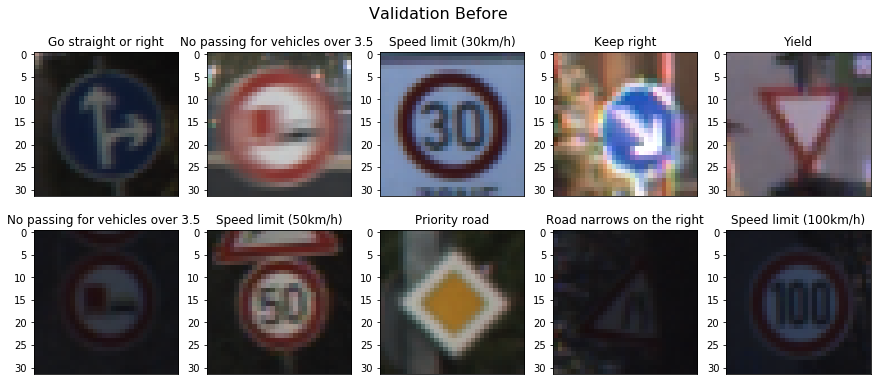

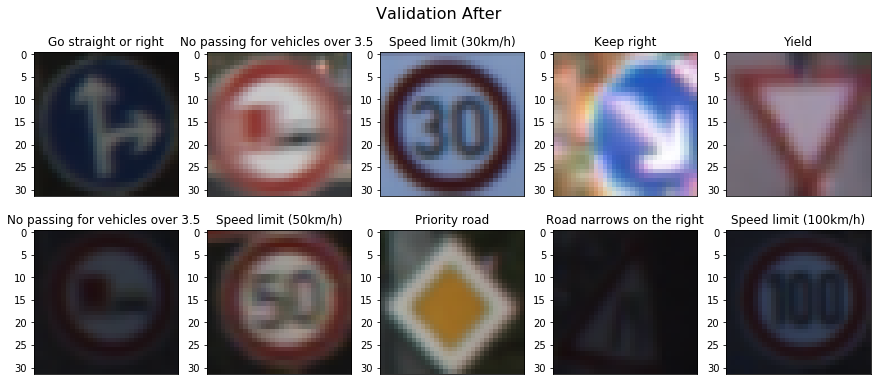

In [15]:
ii = 3
idx = np.arange(n_validation)
np.random.shuffle(idx)
plt.figure(figsize=(15, 6))
plt.suptitle('Validation Before', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_valid[idx[i*ii]], 1]))
    plt.imshow(X_valid[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
    
plt.figure(figsize=(15, 6))
plt.suptitle('Validation After', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_valid[idx[i*ii]], 1]))
    plt.imshow(valid_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

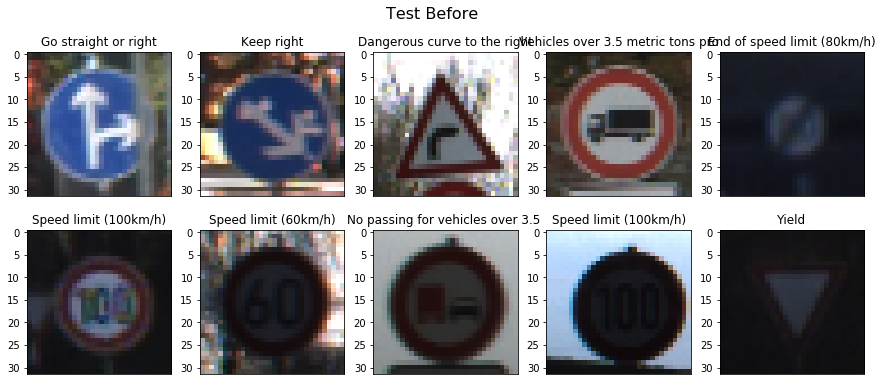

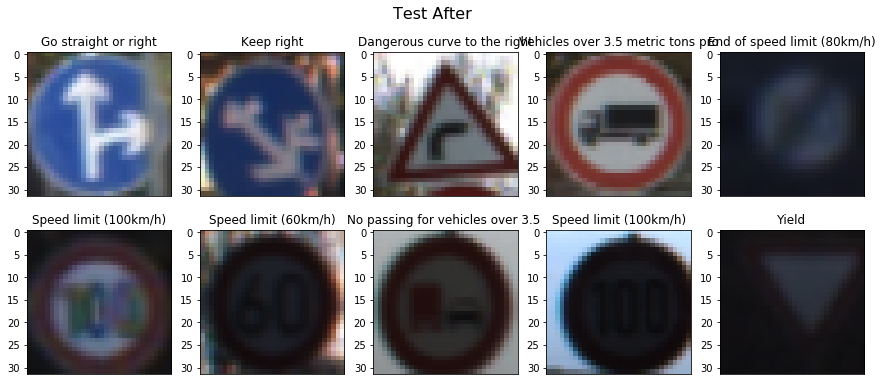

In [16]:
ii = 3
idx = np.arange(n_test)
np.random.shuffle(idx)
plt.figure(figsize=(15, 6))
plt.suptitle('Test Before', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_test[idx[i*ii]], 1]))
    plt.imshow(X_test[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
    
plt.figure(figsize=(15, 6))
plt.suptitle('Test After', fontsize=16)
for i in range(10):
    plt.subplot(2,5,(i+1))
    plt.title('{:.33}'.format(sign_names[y_test[idx[i*ii]], 1]))
    plt.imshow(test_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## I find it useful to see a bunch of images at once, so here's what 80 preprocessed images from each set look like

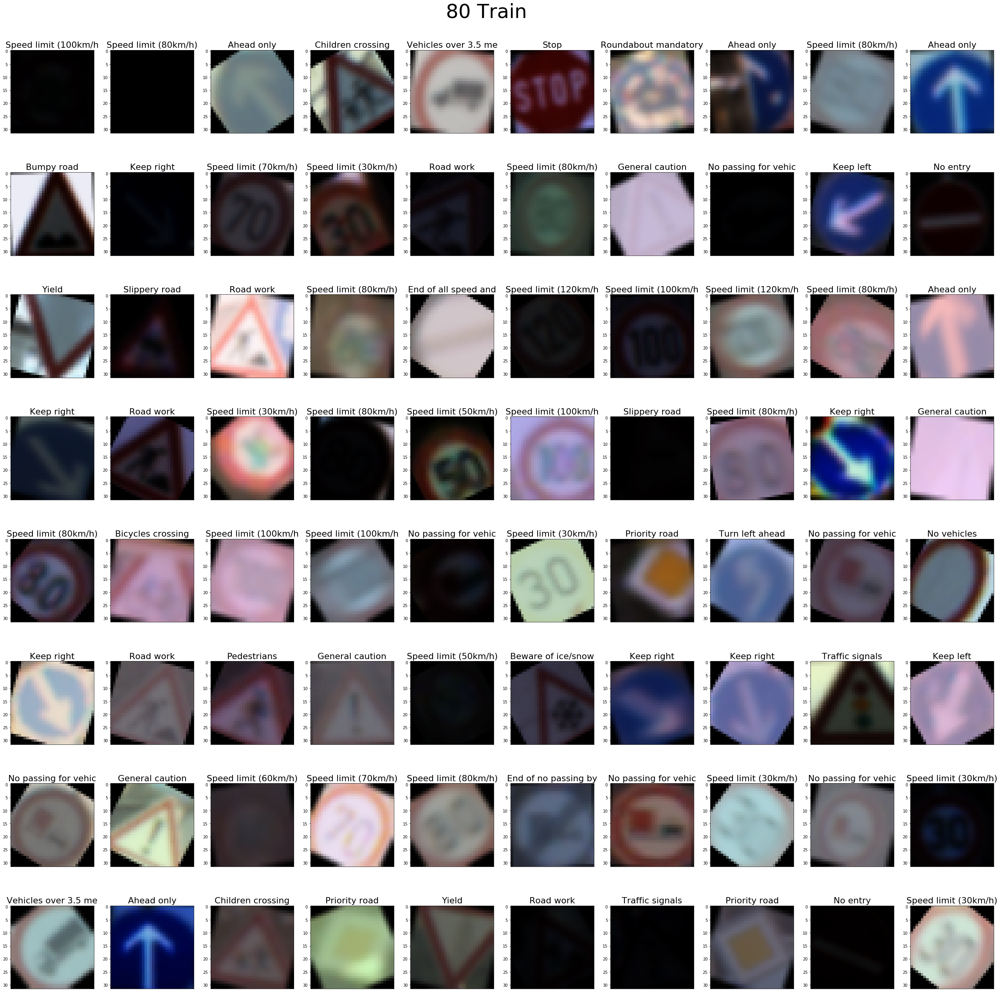

In [17]:
ii = 1
idx = np.arange(n_train)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
plt.suptitle('80 Train', fontsize=50, y=0.91)
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.20}'.format(sign_names[y_train[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(train_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

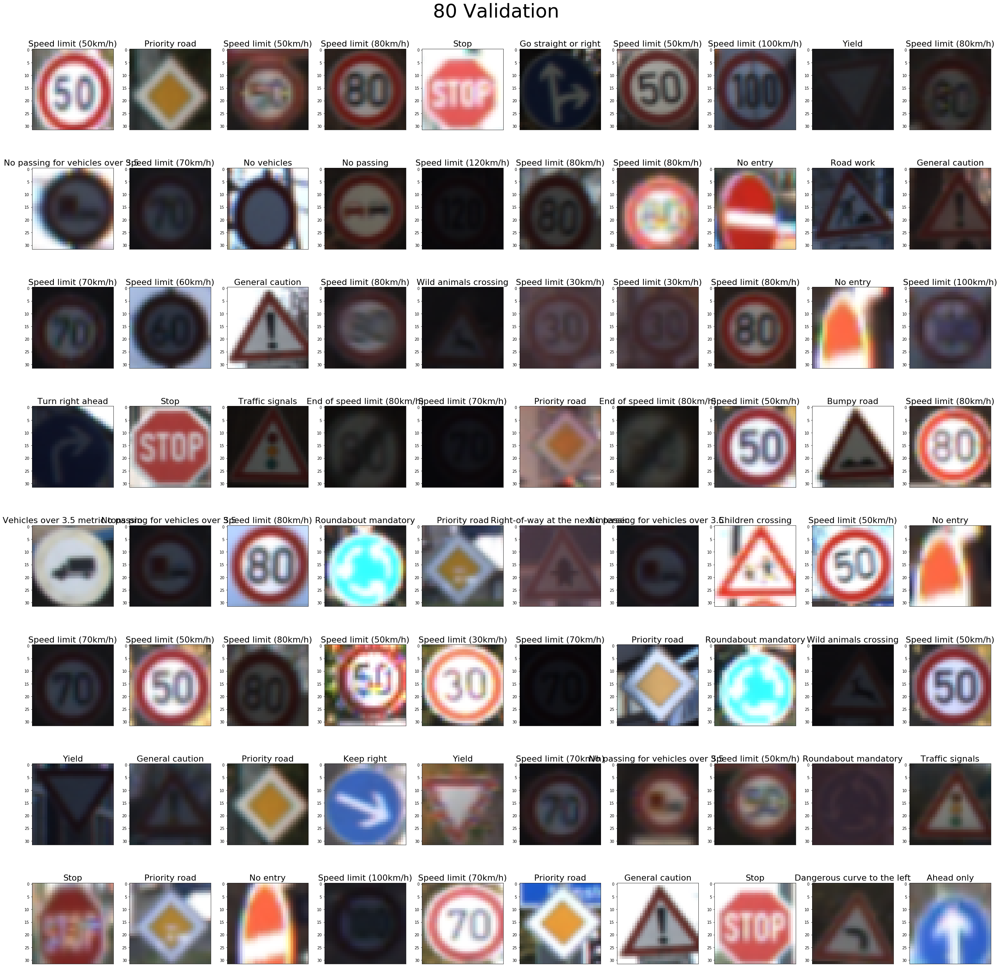

In [18]:
ii = 1
idx = np.arange(n_validation)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
plt.suptitle('80 Validation', fontsize=50, y=0.91)
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.33}'.format(sign_names[y_valid[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(valid_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

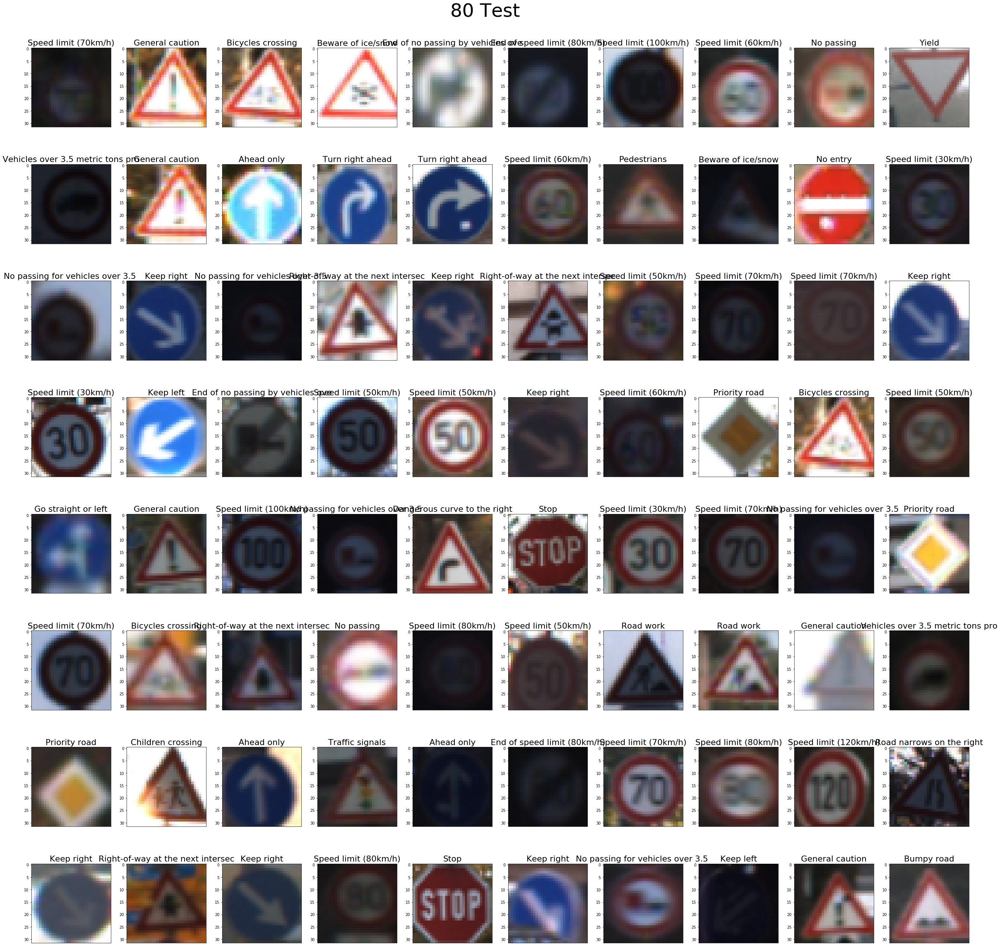

In [19]:
ii = 1
idx = np.arange(n_test)
np.random.shuffle(idx)
plt.figure(figsize=(45, 45))
plt.suptitle('80 Test', fontsize=50, y=0.91)
for i in range(10*8):
    plt.subplot(2*4,5*2,(i+1))
    plt.title('{:.33}'.format(sign_names[y_test[idx[i*ii]], 1]), fontsize=22)
    plt.imshow(test_roi[idx[i*ii]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## Build the brain!

In [20]:
import tensorflow as tf
from collections import namedtuple

In [21]:
def build_network(n_classes, batch_num, size_mult=64, alpha=0.2):
    tf.reset_default_graph()
    
    drop_rate = tf.placeholder(tf.float32, name='drop_rate')
    is_train = tf.placeholder(tf.bool, name='is_train')
    learn_rate = tf.placeholder(tf.float32, name='learn_rate')
    
    with tf.name_scope('inputs'):
        x = tf.placeholder(tf.float32, [None, 32, 32, 3], name='inputs')
    
    with tf.name_scope('targets'):
        targets = tf.placeholder(tf.int32, [None])
        y_one_hot = tf.one_hot(targets, n_classes, name='y_one_hot')
        y_reshaped = tf.reshape(y_one_hot, [-1, n_classes])
        
    with tf.name_scope('CONV1'):
        x1 = tf.layers.conv2d(x, 2*size_mult, 5, strides=1, padding='same', use_bias=True, name='conv1')
        relu1 = tf.maximum(alpha * x1, x1)
        
    with tf.name_scope('CONV2'):
        x2 = tf.layers.conv2d(relu1, 2*size_mult, 5, strides=2, padding='same', use_bias=True, name='conv2')
        relu2 = tf.maximum(alpha * x2, x2)
        
    with tf.name_scope('CONV3'):
        x3 = tf.layers.conv2d(relu2, 4*size_mult, 5, strides=1, padding='same', use_bias=False, name='conv3')
        bn3 = tf.layers.batch_normalization(x3, training=is_train, name='batch3')
        relu3 = tf.maximum(alpha * bn3, bn3)
        do3 = tf.layers.dropout(relu3, rate=drop_rate)
        
    with tf.name_scope('CONV4'):
        x4 = tf.layers.conv2d(do3, 4*size_mult, 5, strides=2, padding='same', use_bias=True, name='conv4')
        relu4 = tf.maximum(alpha * x4, x4)
        
    with tf.name_scope('CONV5'):   
        x5 = tf.layers.conv2d(relu4, 8*size_mult, 3, strides=1, padding='same', use_bias=True, name='conv5')
        relu5 = tf.maximum(alpha * x5, x5)
        do5 = tf.layers.dropout(relu5, rate=drop_rate)
        
    with tf.name_scope('CONV6'):
        x6 = tf.layers.conv2d(do5, 8*size_mult, 3, strides=2, padding='same', use_bias=True, name='conv6')
        relu6 = tf.maximum(alpha * x6, x6)
    
    with tf.name_scope('CONV7'):
        x7 = tf.layers.conv2d(relu6, 8*size_mult, 3, strides=1, padding='same', use_bias=False, name='conv7')
        bn7 = tf.layers.batch_normalization(x7, training=is_train, name='batch7')
        relu7 = tf.maximum(alpha * bn7, bn7)
        do7 = tf.layers.dropout(relu7, rate=drop_rate)
        
    with tf.name_scope('FC8'):
        x8 = tf.contrib.layers.flatten(do7)
        fc8 = tf.layers.dense(x8, 16 * size_mult, use_bias=True, activation=None, name='fc8')
        relu8 = tf.maximum(alpha * fc8, fc8)
        do8 = tf.layers.dropout(relu8, rate=drop_rate)
        
    with tf.name_scope('logits'):
        logits = tf.layers.dense(do8, n_classes, use_bias=True, activation=None, name='logits')
    
    with tf.name_scope('predictions'):
        preds = tf.nn.softmax(logits, name='predictions')
        correct_pred = tf.equal(tf.argmax(logits, 1), tf.argmax(y_reshaped, 1))
        accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32), name='accuracy')
    
    with tf.name_scope('cost'):
        cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=logits, labels=y_reshaped), name='cost')
    
    with tf.name_scope('train'):
        train_opt = tf.train.AdamOptimizer(learn_rate).minimize(cost)
    
    export_nodes = ['x', 'targets', 'drop_rate', 'is_train', 'learn_rate', 'relu1', 'relu2', 'relu3',
                    'relu4', 'relu5', 'relu6', 'relu7', 'correct_pred', 'preds', 'cost', 'accuracy', 'train_opt']
    Graph = namedtuple('Graph', export_nodes)
    local_dict = locals()
    graph = Graph(*[local_dict[each] for each in export_nodes])
    
    return graph

## Here's a couple functions that will allow us to view sample validation images and the network's top-5 softmax probabilities for them during training

In [22]:
how_many = 5

def top_n_predictions(pred, top_n=how_many, probs_off=True):
    values, indices = tf.nn.top_k(pred, k=top_n)
    val = np.squeeze(values.eval()).tolist()
    ind = np.squeeze(indices.eval()).tolist()
    if probs_off:
        out = sign_names[ind, 1]
    else:
        out = val
    
    return out

def view_val_with_preds(sess, image, label, sign_name, size, coord, top_n=how_many):
    sample_x = region_of_interest_test(image, size, coord)
    
    feed = {model.x: sample_x.reshape((1,32,32,-1)), 
            model.targets: label.reshape((1,)), 
            model.drop_rate: 0., 
            model.is_train: False}
    pred = sess.run(model.preds, feed_dict=feed)
    top_n_pred_names = top_n_predictions(pred)
    top_n_pred_probs = top_n_predictions(pred, probs_off=False)
    
    plt.figure(figsize=(10, 8))
    plt.suptitle('{:.33}'.format(sign_name), fontsize=16)
        
    plt.subplot(2,2,1)
    y_pos = np.arange(top_n)
    probabilities = np.flip(top_n_pred_probs, 0)
    plt.barh(y_pos, probabilities, align='center', color='blue', tick_label=np.flip(top_n_pred_names, 0))
    plt.tick_params(axis='x', which='both', bottom='off', top='off', labelbottom='off')
    plt.xlabel('Probability')
    
    plt.subplot(2,2,2)
    plt.imshow(image)
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
        
    plt.subplots_adjust(wspace=0.75)
    plt.show()

## Set hyperparameters and create some useful lists

In [23]:
epochs = 103
batch_size = 32
dropout_rate = 0.4
learn_rate = 0.0001
model = build_network(n_classes, learn_rate, batch_size)
saver = tf.train.Saver()
n_batches = int(n_train/batch_size)
steps = 0
train_losses, batch_accs = [], []
total_wrong_indexes = []
print_every = 200
new_val_acc = 0

## Learn!
I find it useful to keep an eye on the network as it trains and to offer words of encouragement. Intuitively, this doesn't make sense. But, like dropout, it works well in practice.

Epoch 1/103. . . Train Loss 2.765. . . Train Acc 0.2619
Epoch 1/103. . . Train Loss 2.224. . . Train Acc 0.3864
Epoch 1/103. . . Train Loss 1.895. . . Train Acc 0.4705
Epoch 1/103. . . Train Loss 1.662. . . Train Acc 0.5325
Epoch 1/103. . . Train Loss 1.495. . . Train Acc 0.5766

Caclulating loss & accuracy on validation set...
Epoch 1/103. . . Val Loss 3.731. . . Val Acc 0.4745

<Speed limit (30km/h)> is 8% of total wrong
<Speed limit (100km/h> is 5% of total wrong
<Speed limit (120km/h> is 6% of total wrong
<Right-of-way at the > is 6% of total wrong

Epoch 2/103. . . Train Loss 1.353. . . Train Acc 0.6146
Epoch 2/103. . . Train Loss 1.241. . . Train Acc 0.646
Epoch 2/103. . . Train Loss 1.147. . . Train Acc 0.672
Epoch 2/103. . . Train Loss 1.067. . . Train Acc 0.6942
Epoch 2/103. . . Train Loss 1.001. . . Train Acc 0.7129

Caclulating loss & accuracy on validation set...
Epoch 2/103. . . Val Loss 3.717. . . Val Acc 0.4343

<Speed limit (30km/h)> is 9% of total wrong
<Speed limit (5

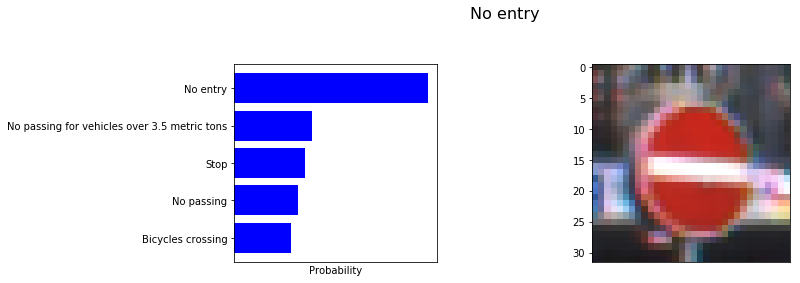

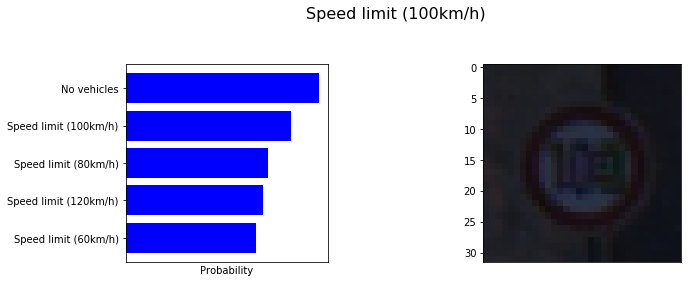

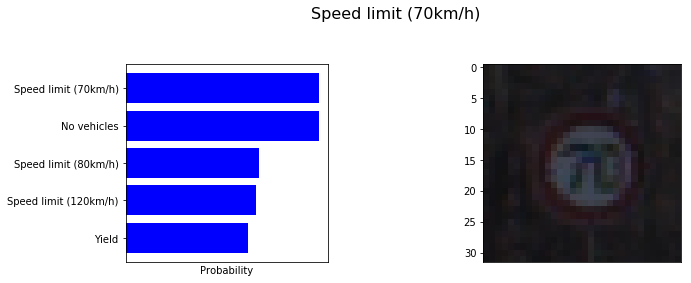

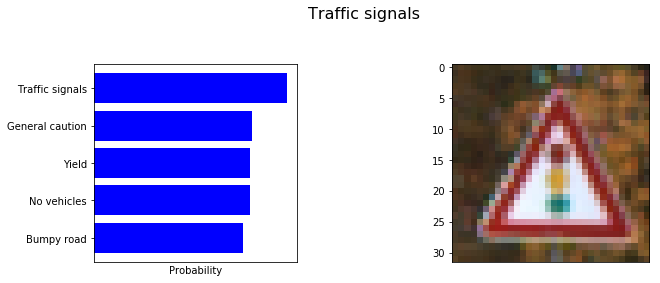

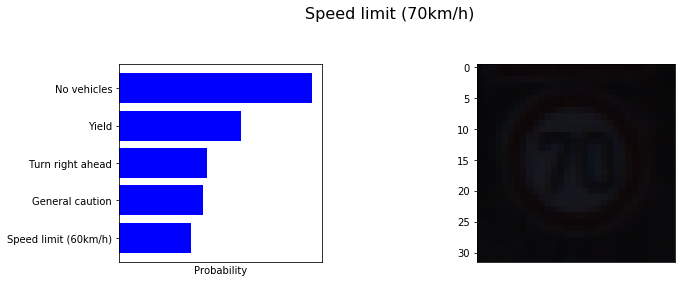

Epoch 11/103. . . Train Loss 0.3229. . . Train Acc 0.9064
Epoch 11/103. . . Train Loss 0.3186. . . Train Acc 0.9076
Epoch 11/103. . . Train Loss 0.3147. . . Train Acc 0.9087
Epoch 11/103. . . Train Loss 0.3108. . . Train Acc 0.9098
Epoch 11/103. . . Train Loss 0.3074. . . Train Acc 0.9108

Caclulating loss & accuracy on validation set...
Epoch 11/103. . . Val Loss 2.707. . . Val Acc 0.6839

<Speed limit (30km/h)> is 8% of total wrong
<Speed limit (50km/h)> is 10% of total wrong
<Speed limit (70km/h)> is 6% of total wrong
<Speed limit (80km/h)> is 6% of total wrong
<Speed limit (120km/h> is 8% of total wrong
<Road work> is 8% of total wrong

Epoch 12/103. . . Train Loss 0.304. . . Train Acc 0.9118
Epoch 12/103. . . Train Loss 0.3004. . . Train Acc 0.9129
Epoch 12/103. . . Train Loss 0.2973. . . Train Acc 0.9138
Epoch 12/103. . . Train Loss 0.2937. . . Train Acc 0.9148
Epoch 12/103. . . Train Loss 0.2908. . . Train Acc 0.9156
Epoch 12/103. . . Train Loss 0.2877. . . Train Acc 0.9165

Cac

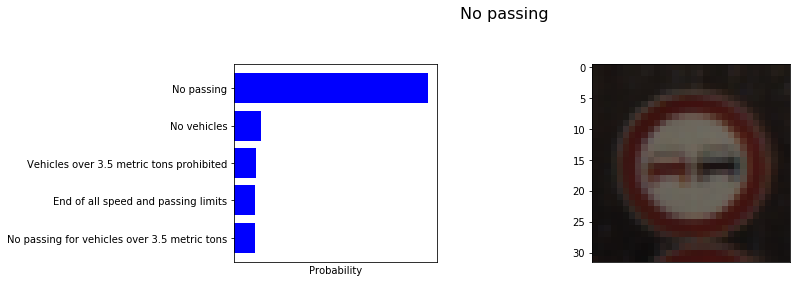

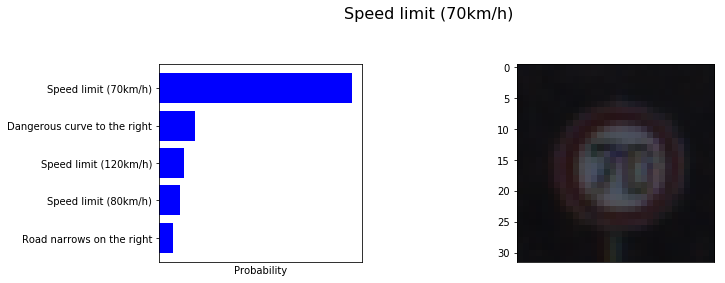

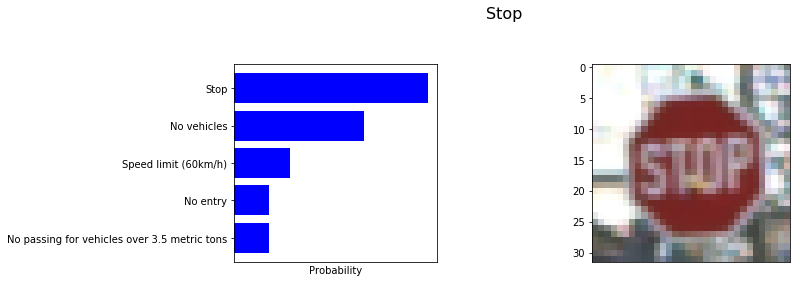

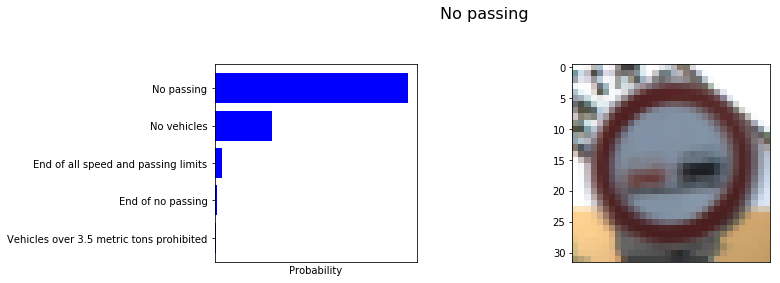

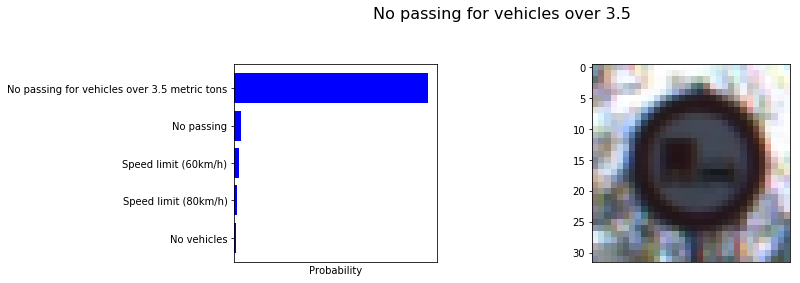

Epoch 21/103. . . Train Loss 0.2013. . . Train Acc 0.9414
Epoch 21/103. . . Train Loss 0.2001. . . Train Acc 0.9418
Epoch 21/103. . . Train Loss 0.1989. . . Train Acc 0.9421
Epoch 21/103. . . Train Loss 0.1977. . . Train Acc 0.9424
Epoch 21/103. . . Train Loss 0.1966. . . Train Acc 0.9428
Epoch 21/103. . . Train Loss 0.1954. . . Train Acc 0.9431

Caclulating loss & accuracy on validation set...
Epoch 21/103. . . Val Loss 0.9138. . . Val Acc 0.8105

<Speed limit (30km/h)> is 9% of total wrong
<Speed limit (70km/h)> is 8% of total wrong
<Speed limit (80km/h)> is 6% of total wrong
<Speed limit (120km/h> is 9% of total wrong
<Road work> is 9% of total wrong
<Roundabout mandatory> is 6% of total wrong

Epoch 22/103. . . Train Loss 0.194. . . Train Acc 0.9435
Epoch 22/103. . . Train Loss 0.1929. . . Train Acc 0.9438
Epoch 22/103. . . Train Loss 0.1917. . . Train Acc 0.9442
Epoch 22/103. . . Train Loss 0.1906. . . Train Acc 0.9445
Epoch 22/103. . . Train Loss 0.1895. . . Train Acc 0.9448

Cac

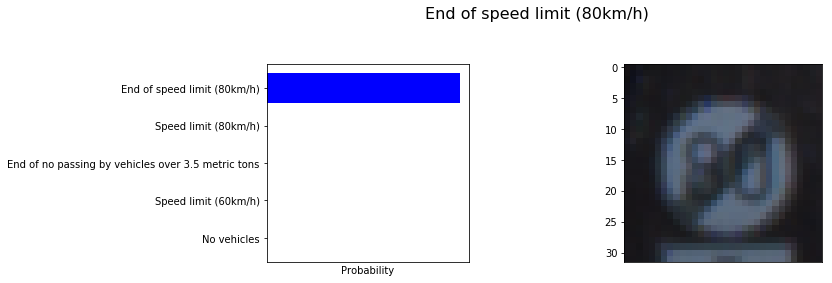

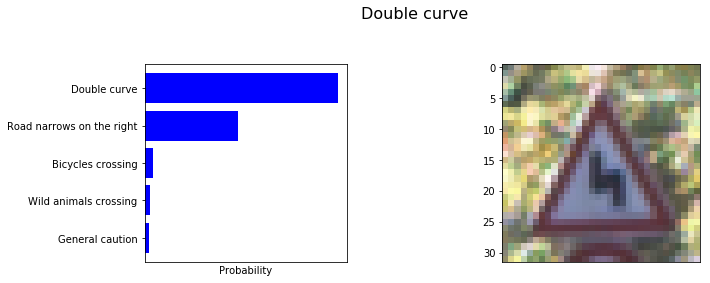

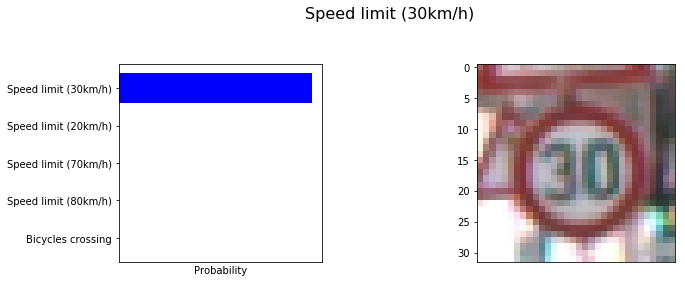

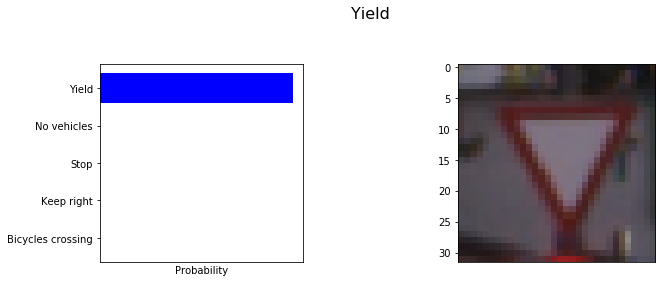

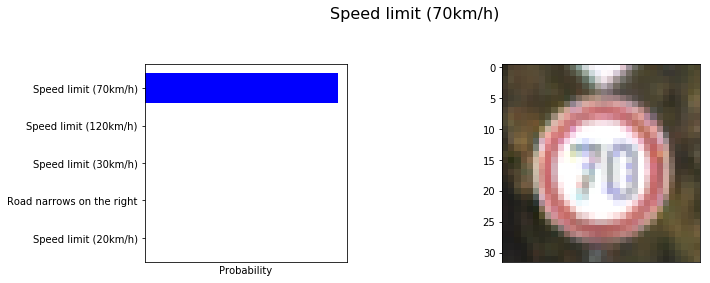

Epoch 31/103. . . Train Loss 0.1522. . . Train Acc 0.9556
Epoch 31/103. . . Train Loss 0.1515. . . Train Acc 0.9558
Epoch 31/103. . . Train Loss 0.1508. . . Train Acc 0.956
Epoch 31/103. . . Train Loss 0.1502. . . Train Acc 0.9562
Epoch 31/103. . . Train Loss 0.1496. . . Train Acc 0.9563

Caclulating loss & accuracy on validation set...
Epoch 31/103. . . Val Loss 0.5534. . . Val Acc 0.8757

<Speed limit (30km/h)> is 5% of total wrong
<Speed limit (50km/h)> is 8% of total wrong
<Speed limit (70km/h)> is 11% of total wrong
<Vehicles over 3.5 me> is 6% of total wrong
<Road work> is 10% of total wrong
<Children crossing> is 6% of total wrong
<Roundabout mandatory> is 5% of total wrong

Epoch 32/103. . . Train Loss 0.149. . . Train Acc 0.9565
Epoch 32/103. . . Train Loss 0.1485. . . Train Acc 0.9567
Epoch 32/103. . . Train Loss 0.1479. . . Train Acc 0.9568
Epoch 32/103. . . Train Loss 0.1472. . . Train Acc 0.957
Epoch 32/103. . . Train Loss 0.1467. . . Train Acc 0.9572
Epoch 32/103. . . Tra

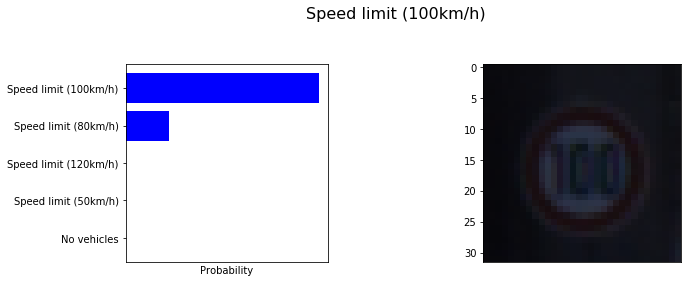

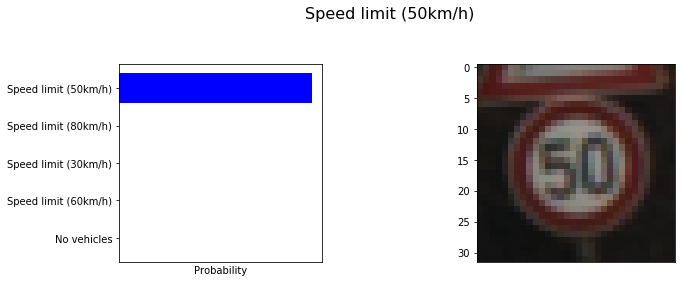

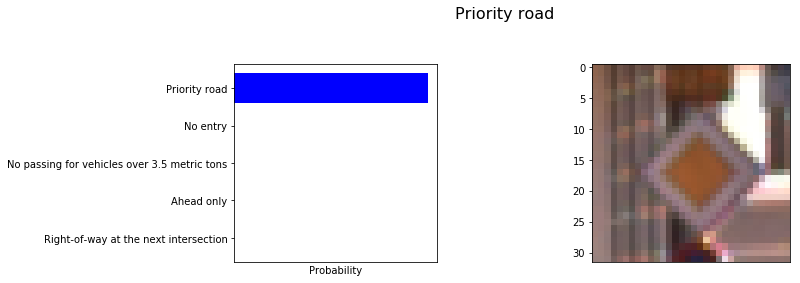

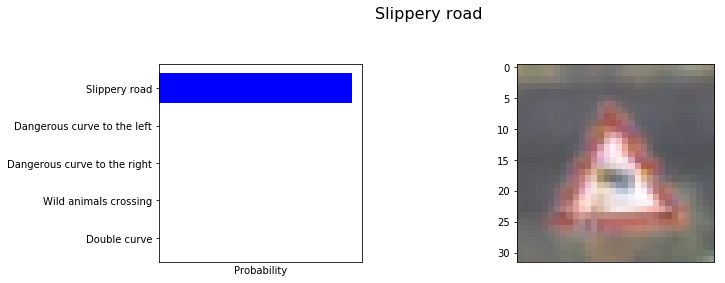

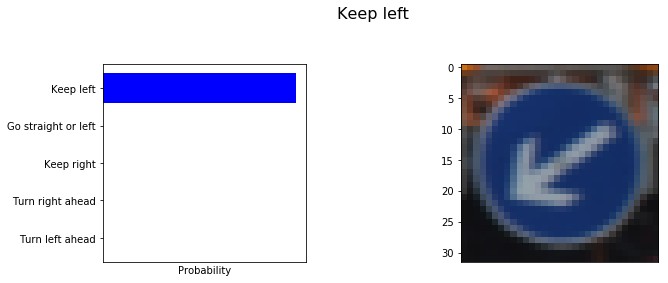

Epoch 41/103. . . Train Loss 0.1252. . . Train Acc 0.9634
Epoch 41/103. . . Train Loss 0.1248. . . Train Acc 0.9635
Epoch 41/103. . . Train Loss 0.1245. . . Train Acc 0.9636
Epoch 41/103. . . Train Loss 0.1241. . . Train Acc 0.9637
Epoch 41/103. . . Train Loss 0.1237. . . Train Acc 0.9638
Epoch 41/103. . . Train Loss 0.1233. . . Train Acc 0.964

Caclulating loss & accuracy on validation set...
Epoch 41/103. . . Val Loss 0.7357. . . Val Acc 0.9052

<Speed limit (30km/h)> is 10% of total wrong
<Speed limit (50km/h)> is 7% of total wrong
<Speed limit (70km/h)> is 12% of total wrong
<Speed limit (100km/h> is 7% of total wrong
<Speed limit (120km/h> is 8% of total wrong
<Vehicles over 3.5 me> is 6% of total wrong
<Road work> is 8% of total wrong
<Pedestrians> is 7% of total wrong

Epoch 42/103. . . Train Loss 0.1229. . . Train Acc 0.9641
Epoch 42/103. . . Train Loss 0.1225. . . Train Acc 0.9642
Epoch 42/103. . . Train Loss 0.1222. . . Train Acc 0.9643
Epoch 42/103. . . Train Loss 0.1218. . 

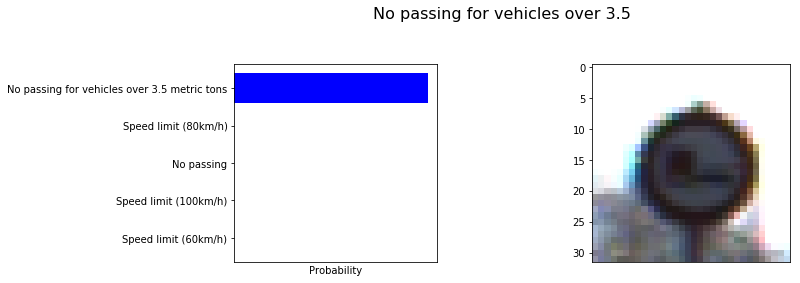

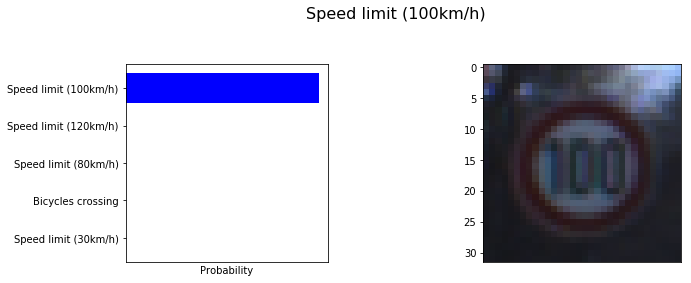

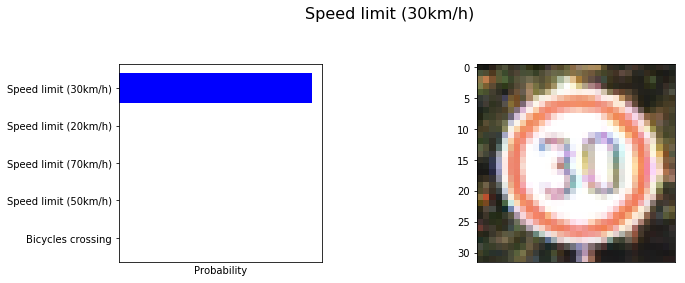

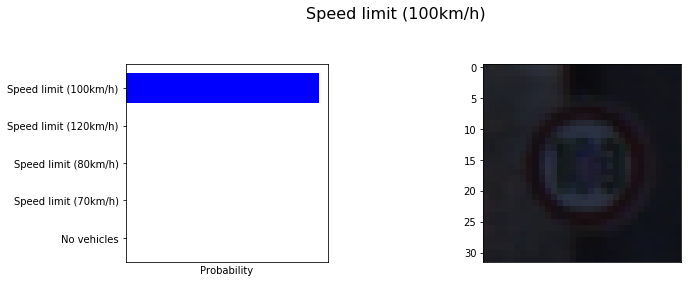

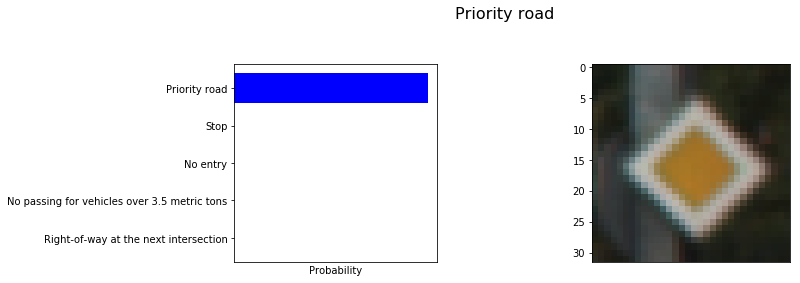

Epoch 51/103. . . Train Loss 0.1075. . . Train Acc 0.9685
Epoch 51/103. . . Train Loss 0.1073. . . Train Acc 0.9686
Epoch 51/103. . . Train Loss 0.107. . . Train Acc 0.9687
Epoch 51/103. . . Train Loss 0.1068. . . Train Acc 0.9688
Epoch 51/103. . . Train Loss 0.1065. . . Train Acc 0.9688

Caclulating loss & accuracy on validation set...
Epoch 51/103. . . Val Loss 0.6106. . . Val Acc 0.94

<Speed limit (20km/h)> is 10% of total wrong
<Speed limit (50km/h)> is 5% of total wrong
<Speed limit (70km/h)> is 9% of total wrong
<Speed limit (120km/h> is 11% of total wrong
<No entry> is 7% of total wrong
<Dangerous curve to t> is 5% of total wrong
<Double curve> is 5% of total wrong
<Road work> is 11% of total wrong
<Roundabout mandatory> is 11% of total wrong

Epoch 52/103. . . Train Loss 0.1063. . . Train Acc 0.9689
Epoch 52/103. . . Train Loss 0.106. . . Train Acc 0.969
Epoch 52/103. . . Train Loss 0.1058. . . Train Acc 0.9691
Epoch 52/103. . . Train Loss 0.1055. . . Train Acc 0.9691
Epoch 52

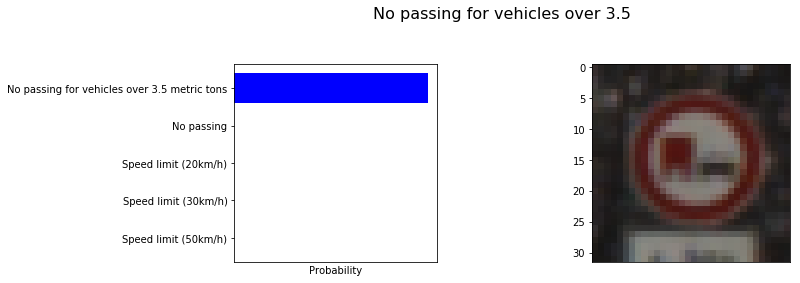

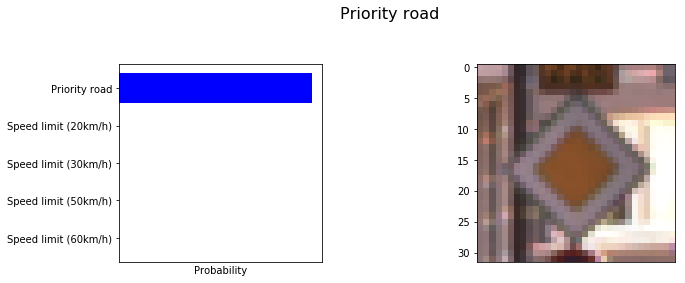

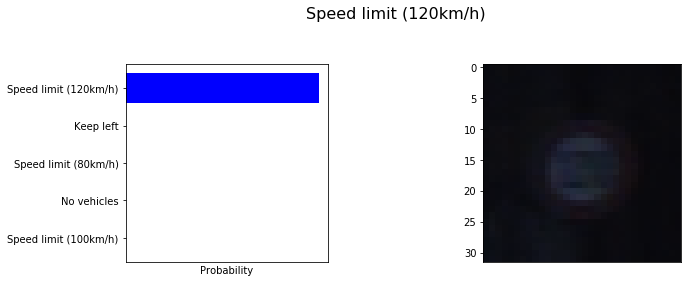

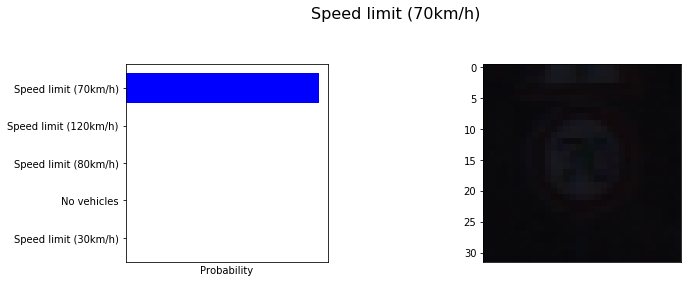

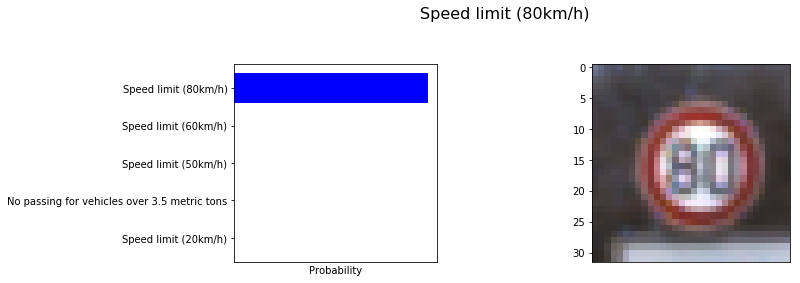

Epoch 61/103. . . Train Loss 0.09538. . . Train Acc 0.9721
Epoch 61/103. . . Train Loss 0.09518. . . Train Acc 0.9722
Epoch 61/103. . . Train Loss 0.09498. . . Train Acc 0.9722
Epoch 61/103. . . Train Loss 0.0948. . . Train Acc 0.9723
Epoch 61/103. . . Train Loss 0.09461. . . Train Acc 0.9723

Caclulating loss & accuracy on validation set...
Epoch 61/103. . . Val Loss 1.053. . . Val Acc 0.9419

<Speed limit (50km/h)> is 8% of total wrong
<Speed limit (120km/h> is 5% of total wrong
<Vehicles over 3.5 me> is 8% of total wrong
<No entry> is 8% of total wrong
<Dangerous curve to t> is 8% of total wrong
<Double curve> is 11% of total wrong
<Slippery road> is 11% of total wrong
<Pedestrians> is 11% of total wrong

Epoch 62/103. . . Train Loss 0.0944. . . Train Acc 0.9724
Epoch 62/103. . . Train Loss 0.09419. . . Train Acc 0.9724
Epoch 62/103. . . Train Loss 0.094. . . Train Acc 0.9725
Epoch 62/103. . . Train Loss 0.09383. . . Train Acc 0.9725
Epoch 62/103. . . Train Loss 0.09363. . . Train A

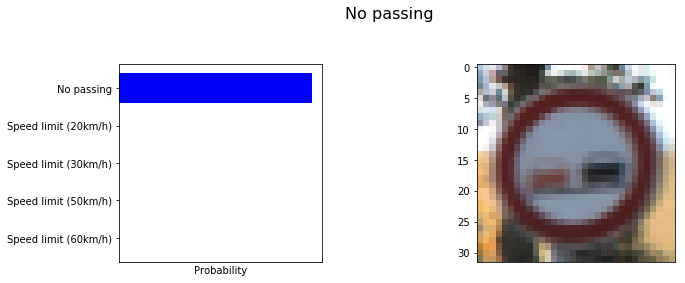

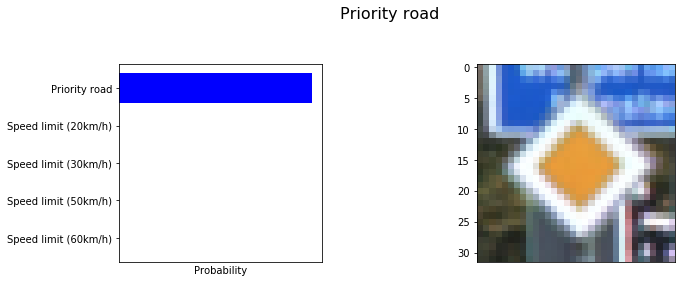

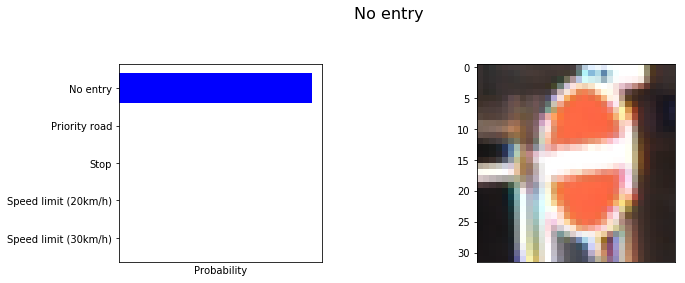

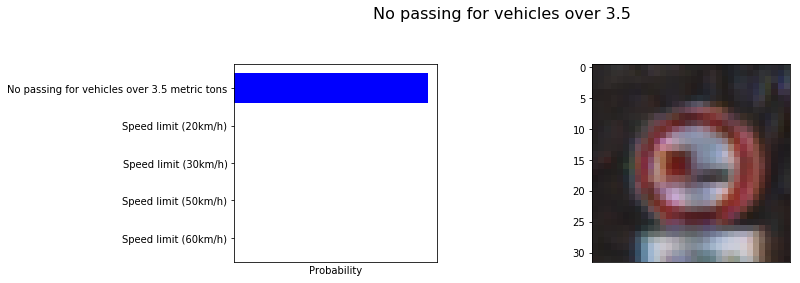

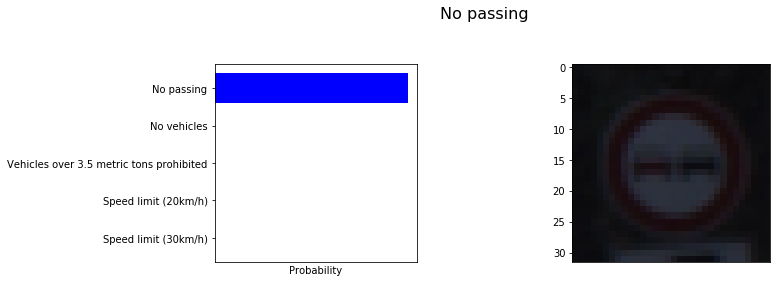

Epoch 71/103. . . Train Loss 0.08619. . . Train Acc 0.9748
Epoch 71/103. . . Train Loss 0.08605. . . Train Acc 0.9748
Epoch 71/103. . . Train Loss 0.08592. . . Train Acc 0.9749
Epoch 71/103. . . Train Loss 0.08577. . . Train Acc 0.9749
Epoch 71/103. . . Train Loss 0.08561. . . Train Acc 0.975
Epoch 71/103. . . Train Loss 0.08547. . . Train Acc 0.975

Caclulating loss & accuracy on validation set...
Epoch 71/103. . . Val Loss 0.9464. . . Val Acc 0.9625

<Speed limit (30km/h)> is 5% of total wrong
<Speed limit (120km/h> is 10% of total wrong
<No entry> is 10% of total wrong
<Dangerous curve to t> is 8% of total wrong
<Double curve> is 7% of total wrong
<Road work> is 14% of total wrong
<Pedestrians> is 13% of total wrong

Epoch 72/103. . . Train Loss 0.08531. . . Train Acc 0.975
Epoch 72/103. . . Train Loss 0.08518. . . Train Acc 0.9751
Epoch 72/103. . . Train Loss 0.08503. . . Train Acc 0.9751
Epoch 72/103. . . Train Loss 0.08489. . . Train Acc 0.9752
Epoch 72/103. . . Train Loss 0.0847

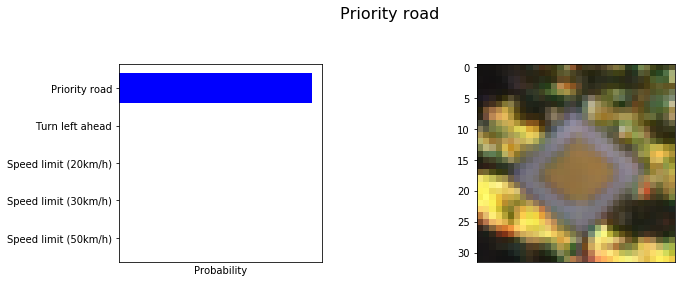

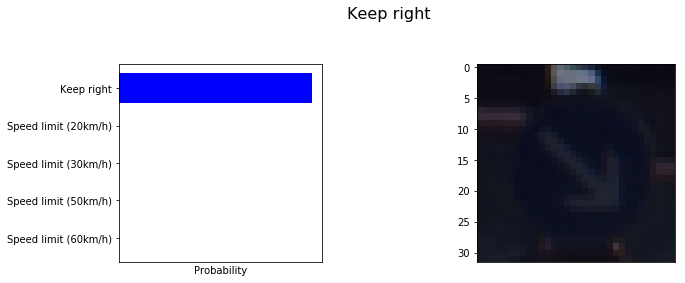

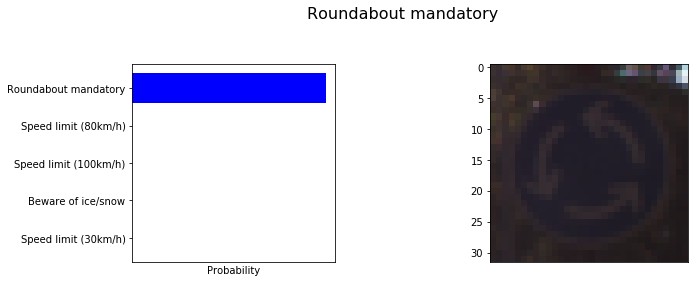

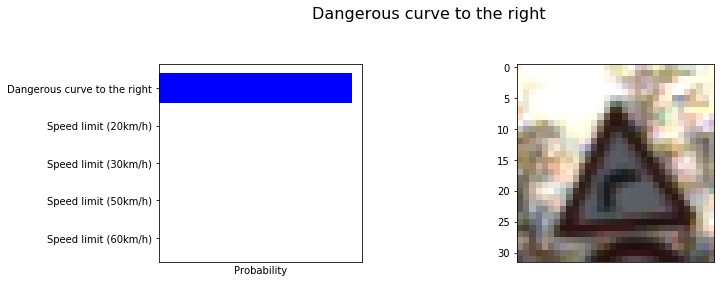

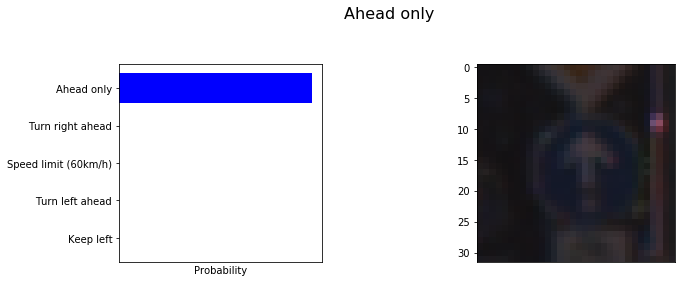

Epoch 81/103. . . Train Loss 0.07886. . . Train Acc 0.9769
Epoch 81/103. . . Train Loss 0.07875. . . Train Acc 0.977
Epoch 81/103. . . Train Loss 0.07864. . . Train Acc 0.977
Epoch 81/103. . . Train Loss 0.07853. . . Train Acc 0.977
Epoch 81/103. . . Train Loss 0.07841. . . Train Acc 0.9771

Caclulating loss & accuracy on validation set...
Epoch 81/103. . . Val Loss 1.383. . . Val Acc 0.9528

<Speed limit (50km/h)> is 6% of total wrong
<Speed limit (70km/h)> is 5% of total wrong
<Speed limit (80km/h)> is 7% of total wrong
<Speed limit (120km/h> is 11% of total wrong
<No entry> is 13% of total wrong
<Dangerous curve to t> is 7% of total wrong
<Road work> is 13% of total wrong
<Roundabout mandatory> is 8% of total wrong

Epoch 82/103. . . Train Loss 0.07829. . . Train Acc 0.9771
Epoch 82/103. . . Train Loss 0.07818. . . Train Acc 0.9771
Epoch 82/103. . . Train Loss 0.07806. . . Train Acc 0.9772
Epoch 82/103. . . Train Loss 0.07794. . . Train Acc 0.9772
Epoch 82/103. . . Train Loss 0.0778

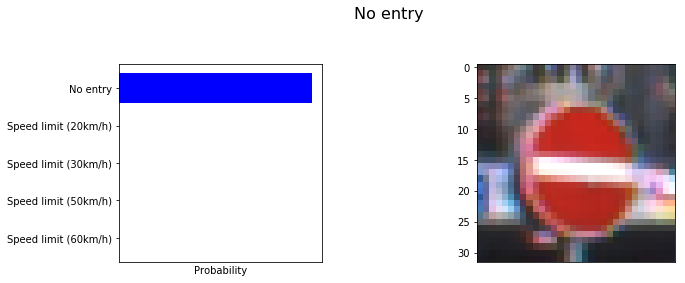

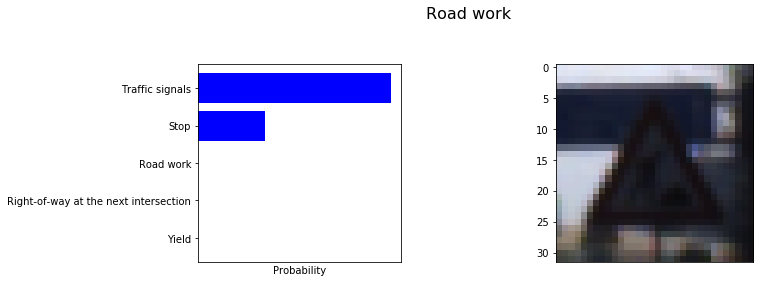

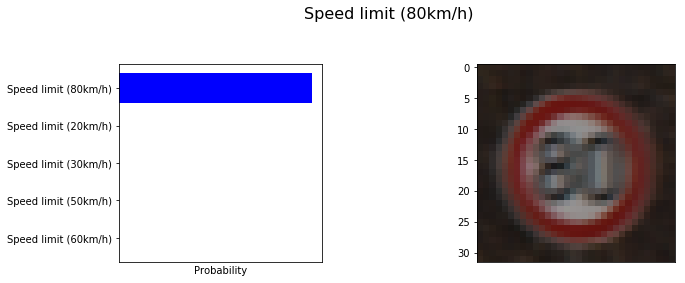

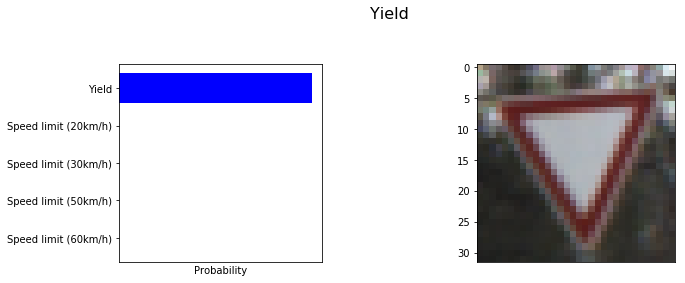

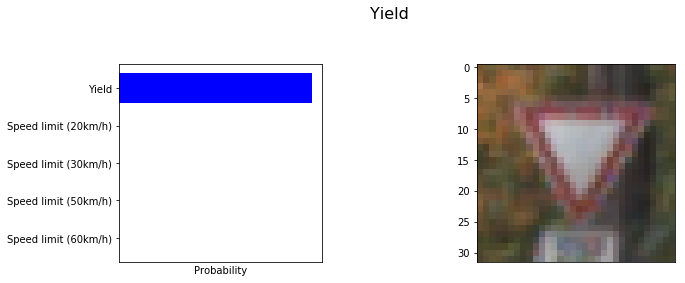

Epoch 91/103. . . Train Loss 0.07313. . . Train Acc 0.9786
Epoch 91/103. . . Train Loss 0.07304. . . Train Acc 0.9786
Epoch 91/103. . . Train Loss 0.07295. . . Train Acc 0.9787
Epoch 91/103. . . Train Loss 0.07285. . . Train Acc 0.9787
Epoch 91/103. . . Train Loss 0.07276. . . Train Acc 0.9787
Epoch 91/103. . . Train Loss 0.07266. . . Train Acc 0.9787

Caclulating loss & accuracy on validation set...
Epoch 91/103. . . Val Loss 3.265. . . Val Acc 0.9521

<Speed limit (120km/h> is 12% of total wrong
<Vehicles over 3.5 me> is 14% of total wrong
<No entry> is 9% of total wrong
<Dangerous curve to t> is 5% of total wrong
<Road work> is 13% of total wrong
<Bicycles crossing> is 12% of total wrong
<Roundabout mandatory> is 9% of total wrong

Epoch 92/103. . . Train Loss 0.07256. . . Train Acc 0.9788
Epoch 92/103. . . Train Loss 0.07246. . . Train Acc 0.9788
Epoch 92/103. . . Train Loss 0.07236. . . Train Acc 0.9788
Epoch 92/103. . . Train Loss 0.07226. . . Train Acc 0.9789
Epoch 92/103. . . T

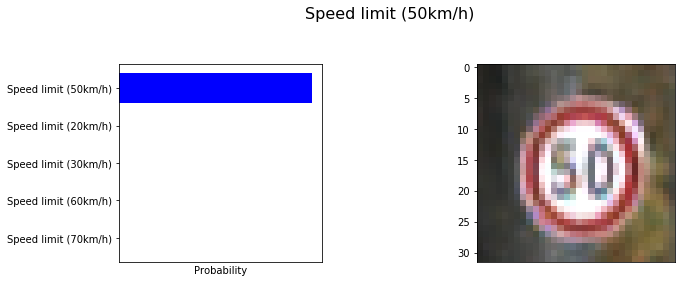

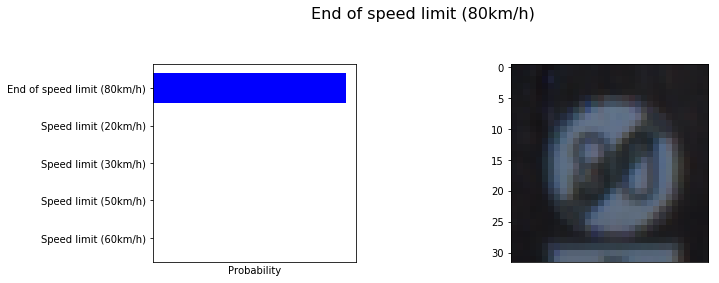

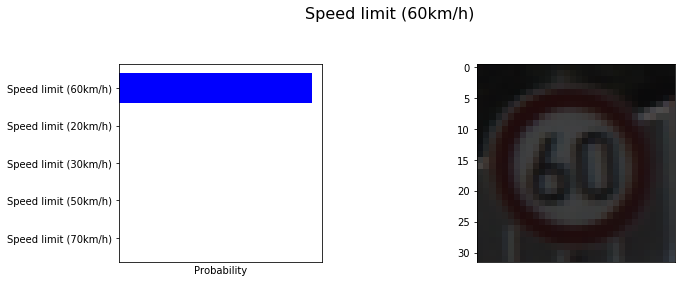

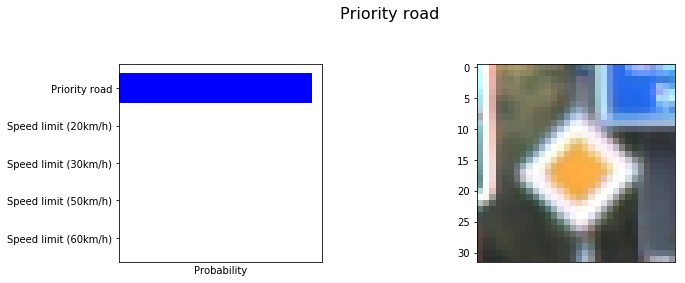

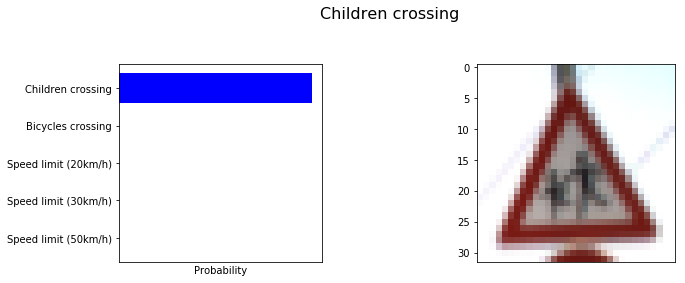

Epoch 101/103. . . Train Loss 0.06824. . . Train Acc 0.98
Epoch 101/103. . . Train Loss 0.06817. . . Train Acc 0.9801
Epoch 101/103. . . Train Loss 0.06809. . . Train Acc 0.9801
Epoch 101/103. . . Train Loss 0.06801. . . Train Acc 0.9801
Epoch 101/103. . . Train Loss 0.06796. . . Train Acc 0.9801

Caclulating loss & accuracy on validation set...
Epoch 101/103. . . Val Loss 2.706. . . Val Acc 0.9524

<Speed limit (50km/h)> is 6% of total wrong
<Speed limit (80km/h)> is 8% of total wrong
<Speed limit (120km/h> is 12% of total wrong
<Vehicles over 3.5 me> is 9% of total wrong
<No entry> is 9% of total wrong
<Dangerous curve to t> is 10% of total wrong
<Slippery road> is 8% of total wrong
<Children crossing> is 5% of total wrong

Epoch 102/103. . . Train Loss 0.06788. . . Train Acc 0.9801
Epoch 102/103. . . Train Loss 0.06779. . . Train Acc 0.9802
Epoch 102/103. . . Train Loss 0.06772. . . Train Acc 0.9802
Epoch 102/103. . . Train Loss 0.06764. . . Train Acc 0.9802
Epoch 102/103. . . Train

In [24]:
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    for e in range(epochs):
        for x, y, _, _, _  in get_batches_train(X_train, y_train, sign_names, train_sizes, train_coord, batch_size):
            steps += 1
            feed = {model.x: x, 
                    model.targets: y, 
                    model.drop_rate: dropout_rate, 
                    model.is_train: True, 
                    model.learn_rate: learn_rate}
            batch_acc, batch_loss, _ = sess.run([model.accuracy, model.cost, model.train_opt], feed_dict=feed)
            train_losses.append(batch_loss)
            batch_accs.append(batch_acc)
            
            if steps % print_every == 0:
                avg_loss = np.mean(train_losses)
                avg_acc = np.mean(batch_accs)
                print('Epoch {}/{}. . . Train Loss {:.4}. . . Train Acc {:.4}'.format(e+1, epochs, avg_loss, avg_acc))

        print('')
        print('Caclulating loss & accuracy on validation set...')
        val_losses, val_accs, wrong_indexes = [], [], []
        for val_idx, val_x, val_y, val_names, _, _  in get_batches_test(X_valid, y_valid, sign_names, 
                                                          valid_sizes, valid_coord, batch_size):
            feed = {model.x: val_x, 
                    model.targets: val_y, 
                    model.drop_rate: 0., 
                    model.is_train: False}
            val_acc, val_cor, val_loss = sess.run([model.accuracy, model.correct_pred, model.cost], feed_dict=feed)
            wrong_idx = [val_idx[i] for i in range(len(val_cor)) if val_cor[i] == False]
            wrong_indexes.append(wrong_idx)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
        avg_val_loss = np.mean(val_losses)
        avg_val_acc = np.mean(val_accs)
        print('Epoch {}/{}. . . Val Loss {:.4}. . . Val Acc {:.4}'.format(e+1, epochs, avg_val_loss, avg_val_acc))
        # Save only checkpoints with a validation accuracy over 90%
        if avg_val_acc > 0.90:
            if new_val_acc == 0:
                !mkdir checks
            if avg_val_acc > new_val_acc:
                new_val_acc = avg_val_acc
                saver.save(sess, './checks/tsigns.ckpt')
                print('Model Saved!')
        print('')
        
        wrong_indexes = np.array([p for sublist in wrong_indexes for p in sublist])
        ind, cnt = np.unique(y_valid[wrong_indexes], return_counts=True)
        wrong_names = [sign_names[ind[i], 1] for i in range(len(ind))]
        for i in range(len(cnt)):
            # Only print sign names of those wrong 5% or more of time
            if (cnt[i]/np.sum(cnt))*100 > 4.9:
                print('<{:.20}> is {:.0f}% of total wrong'.format(wrong_names[i], (cnt[i]/np.sum(cnt))*100))
        print('')
        total_wrong_indexes.append(wrong_indexes)
        
        # Every 10 epochs, let's look at some validation images and the top-5 predicted labels
        if (e+1) % 10 == 0:
            print('Displaying validation samples...')
            num_images = len(X_valid)
            idx = np.arange(num_images)
            np.random.shuffle(idx)
            num_show = 5
            [view_val_with_preds(sess, X_valid[idx[i]], y_valid[idx[i]], sign_names[y_valid[idx[i]], 1], 
                                 valid_sizes[idx[i]], valid_coord[idx[i]]) for i in range(num_show)]
        
        #delete above and use below to only view images that were misclassified:
        #num_images = len(wrong_indexes)
        #idx = np.arange(num_images)
        #np.random.shuffle(idx)
        #num_show = 10
        #[view_val_with_preds(sess, X_valid[wrong_indexes[idx[i]]], y_valid[wrong_indexes[idx[i]]], 
        #                     sign_names[y_valid[wrong_indexes[idx[i]]], 1], valid_sizes[wrong_indexes[idx[i]]], 
        #                     valid_coord[wrong_indexes[idx[i]]]) for i in range(num_show)]
        
        
    print('Model finished training :)')

## Load best checkpoint and double-check accuracy on val set

INFO:tensorflow:Restoring parameters from checks/tsigns.ckpt
Validation Accuracy 0.9709
Displaying validation samples...


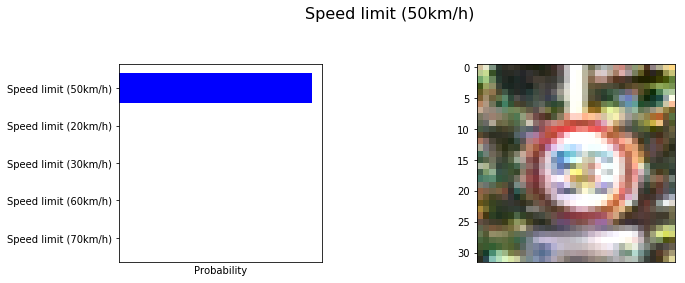

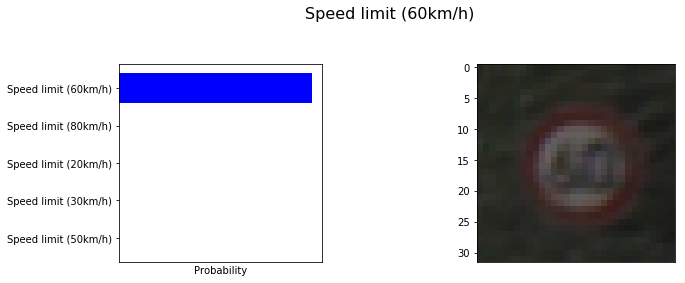

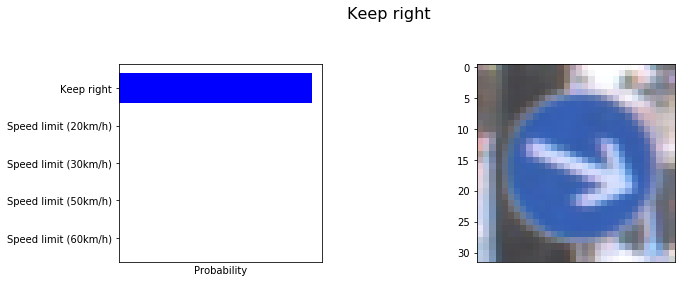

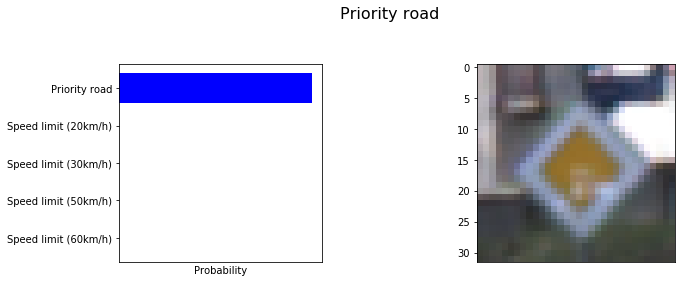

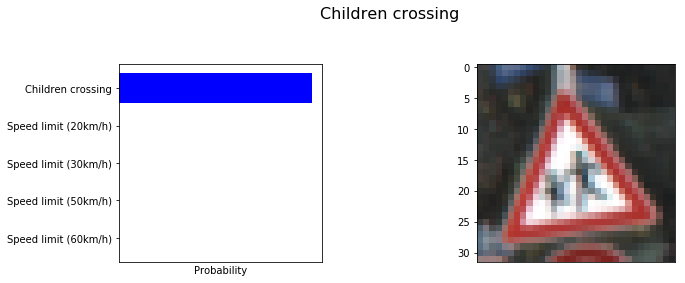

Total misclassified signs in validation set: 128


In [26]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks'))
    test_accs, wrong_indices = [], []
    for test_idx, test_x, test_y, test_names, _, _  in get_batches_test(X_valid, y_valid, sign_names, 
                                                                    valid_sizes, valid_coord, batch_size):
        feed = {model.x: test_x, 
                model.targets: test_y, 
                model.drop_rate: 0., 
                model.is_train: False}
        test_acc, test_cor = sess.run([model.accuracy, model.correct_pred], feed_dict=feed)
        test_accs.append(test_acc)
        wrong_idx = [test_idx[i] for i in range(len(test_cor)) if test_cor[i] == False]
        wrong_indices.append(wrong_idx)
    avg_test_acc = np.mean(test_accs)
    print('Validation Accuracy {:.4}'.format(avg_test_acc))
    print('Displaying validation samples...')
    num_images = len(X_valid)
    idx = np.arange(num_images)
    np.random.shuffle(idx)
    num_show = 5
    [view_val_with_preds(sess, X_valid[idx[i]], y_valid[idx[i]], sign_names[y_valid[idx[i]], 1], 
                         valid_sizes[idx[i]], valid_coord[idx[i]]) for i in range(num_show)]
    
wrong_indices = np.array([p for sublist in wrong_indices for p in sublist])
n_wrong = len(wrong_indices)
print('Total misclassified signs in validation set: {}'.format(n_wrong))

## Have a gander at some of the misclassified images

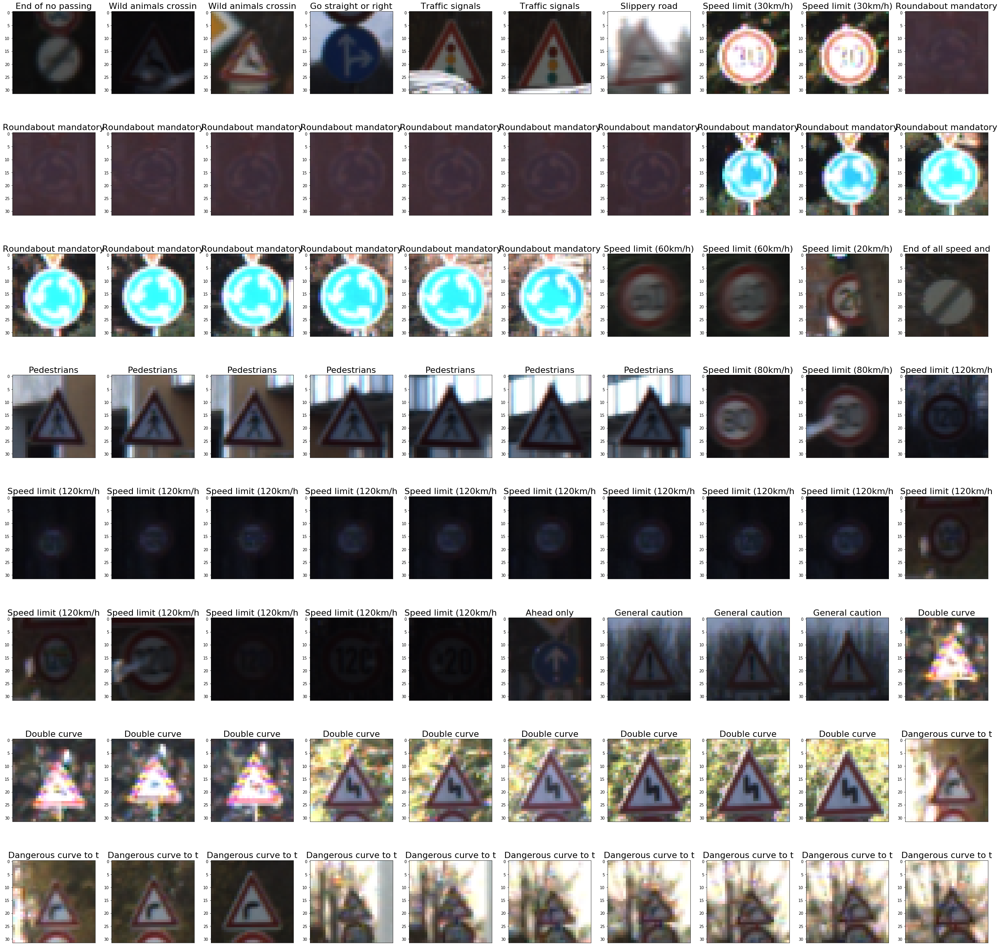

In [27]:
plt.figure(figsize=(45, 45))
for i in range(80):
    plt.subplot(8,10,(i+1))
    plt.title('{:.20}'.format(sign_names[y_valid[wrong_indices[i]], 1]), fontsize=22)
    plt.imshow(X_valid[wrong_indices[i]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## Check accuracy on test set

I'll also track the true positives, true negatives, false positives, and false negatives, then calculate the precision, recall, and specificity for each class. This can help determine how to augment data by showing the network's weak labels.

INFO:tensorflow:Restoring parameters from checks/tsigns.ckpt
Test Accuracy 0.9379
Displaying test samples...


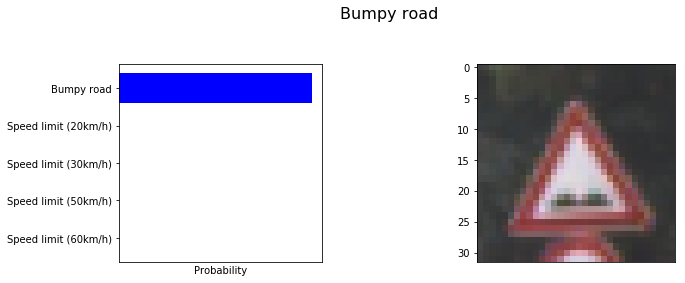

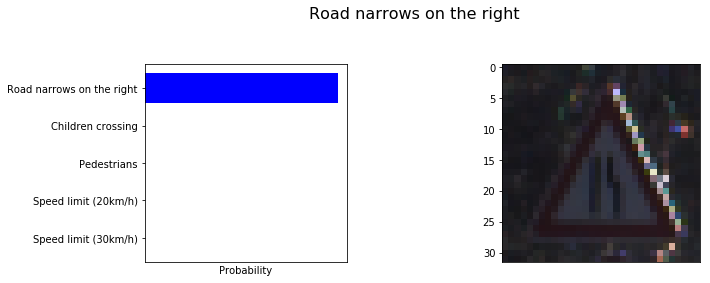

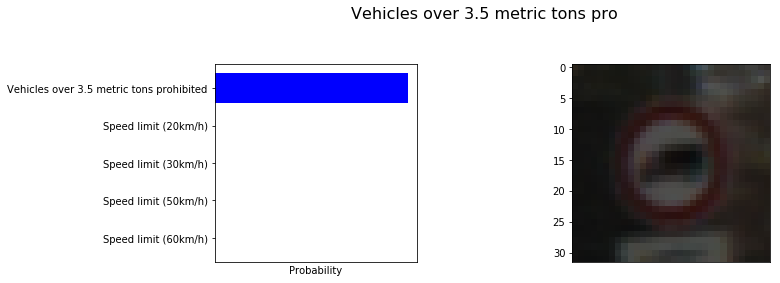

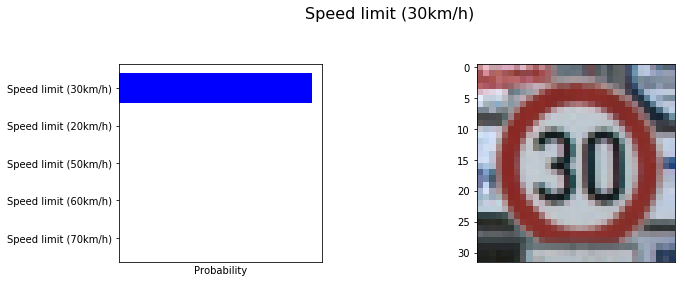

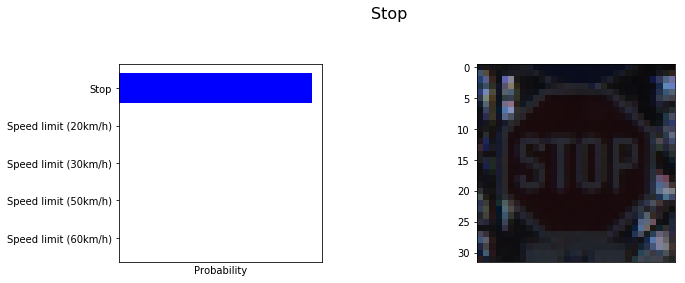

Total misclassified signs in test set: 783

Double-check accuracy: 0.938

Speed limit (20km/h):
     precision: 0.8657
     recall: 1.0
     specificity: 0.9992

Speed limit (30km/h):
     precision: 0.9461
     recall: 0.9338
     specificity: 0.9963

Speed limit (50km/h):
     precision: 0.9426
     recall: 1.0
     specificity: 0.996

Speed limit (60km/h):
     precision: 0.9684
     recall: 0.9555
     specificity: 0.9988

Speed limit (70km/h):
     precision: 0.9815
     recall: 0.922
     specificity: 0.9989

Speed limit (80km/h):
     precision: 0.9259
     recall: 0.9623
     specificity: 0.9958

End of speed limit (80km/h):
     precision: 1.0
     recall: 1.0
     specificity: 1.0

Speed limit (100km/h):
     precision: 0.9699
     recall: 0.8915
     specificity: 0.9989

Speed limit (120km/h):
     precision: 0.9952
     recall: 1.0
     specificity: 0.9998

No passing:
     precision: 0.9955
     recall: 0.8402
     specificity: 0.9998

No passing for vehicles over 3.5 metr

In [28]:
tp = np.zeros(n_classes)
tn = np.zeros(n_classes)
fp = np.zeros(n_classes)
fn = np.zeros(n_classes)

with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks'))
    test_accs, wrong_indices = [], []
    for test_idx, test_x, test_y, test_names, _, _  in get_batches_test(X_test, y_test, sign_names, 
                                                                    test_sizes, test_coord, batch_size):
        feed = {model.x: test_x, 
                model.targets: test_y, 
                model.drop_rate: 0., 
                model.is_train: False}
        test_acc, test_preds, test_cor = sess.run([model.accuracy, model.preds, model.correct_pred], feed_dict=feed)
        test_preds = tf.argmax(test_preds, 1).eval()
        for i in range(len(test_cor)):
            if test_cor[i] == True:
                tp[test_y[i]] += 1
                for j in range(n_classes):
                    if j != test_y[i]:
                        tn[j] += 1
            if test_cor[i] == False:
                fp[test_preds[i]] += 1
                fn[y_test[i]] += 1
        
        test_accs.append(test_acc)
        wrong_idx = [test_idx[i] for i in range(len(test_cor)) if test_cor[i] == False]
        wrong_indices.append(wrong_idx)
    avg_test_acc = np.mean(test_accs)
    print('Test Accuracy {:.4}'.format(avg_test_acc))
    print('Displaying test samples...')
    num_images = len(X_test)
    idx = np.arange(num_images)
    np.random.shuffle(idx)
    num_show = 5
    [view_val_with_preds(sess, X_test[idx[i]], y_test[idx[i]], sign_names[y_test[idx[i]], 1], 
                         test_sizes[idx[i]], test_coord[idx[i]]) for i in range(num_show)]

wrong_indices = np.array([p for sublist in wrong_indices for p in sublist])
n_wrong = len(wrong_indices)
print('Total misclassified signs in test set: {}'.format(n_wrong))
print('')
precision = tp / (tp + fp)
recall = tp / (tp + fn)
specificity = tn / (tn + fp)
accuracy = np.sum(tp) / len(X_test)
print('Double-check accuracy: {:.4}'.format(accuracy))
print('')
for i in range(n_classes):
    print('{}:'.format(sign_names[i, 1]))
    print('     precision: {:.4}'.format(precision[i]))
    print('     recall: {:.4}'.format(recall[i]))
    print('     specificity: {:.4}'.format(specificity[i]))
    print('')

## Some more misclassified images, this time from the test set

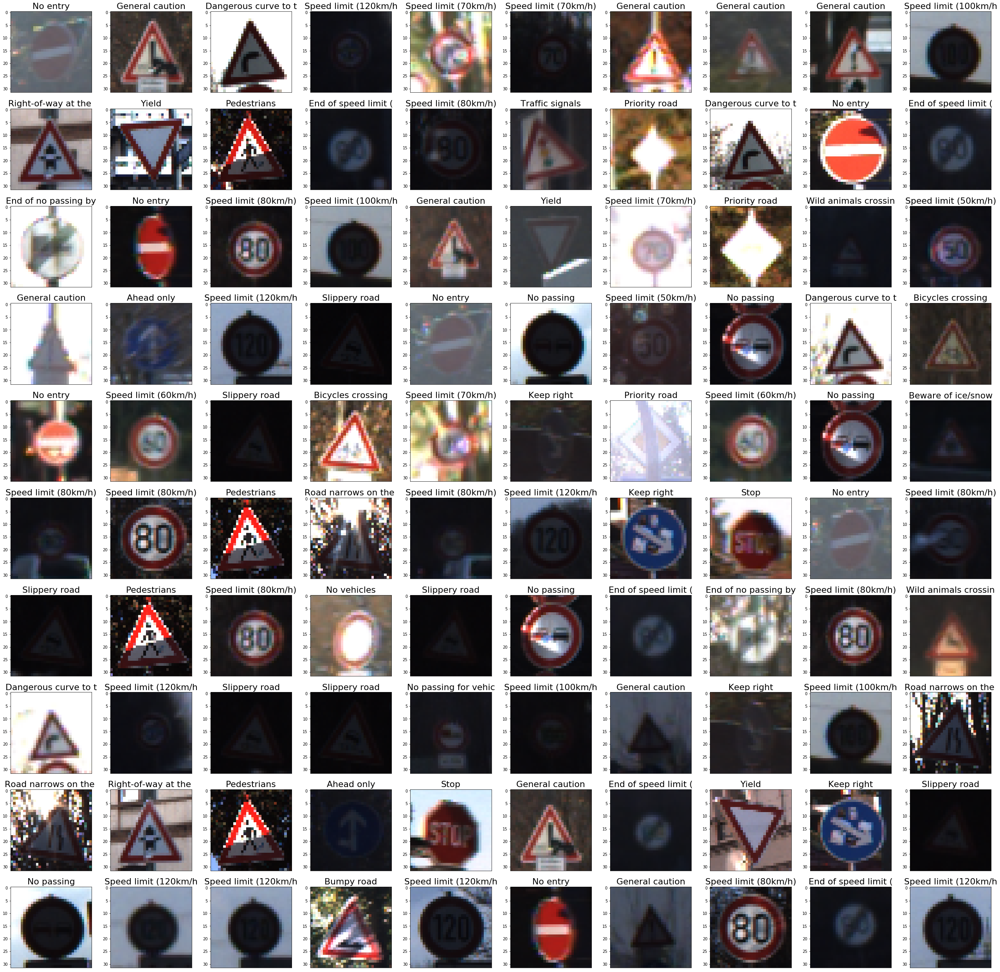

In [29]:
plt.figure(figsize=(45, 45))
for i in range(100):
    plt.subplot(10,10,(i+1))
    plt.title('{:.20}'.format(sign_names[y_test[wrong_indices[i+100]], 1]), fontsize=22)
    plt.imshow(X_test[wrong_indices[i+100]])
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')

## Let's see how the network performs with new images found on the web

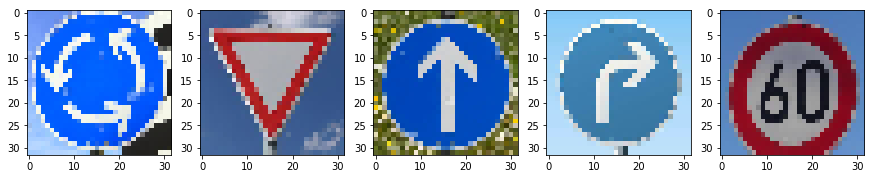

In [30]:
eg1 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_1.jpg'), dsize=(32,32)))
eg2 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_2.jpg'), dsize=(32,32)))
eg3 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_4.jpg'), dsize=(32,32)))
eg4 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_5.jpg'), dsize=(32,32)))
eg5 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/example_6.jpg'), dsize=(32,32)))
egs = [eg1, eg2, eg3, eg4, eg5]
plt.figure(figsize=(15,5))
for i in range(5):
    plt.subplot(1,5,(i+1))
    plt.imshow(egs[i])

In [31]:
def view_web_with_preds(sess, image, top_n=how_many):
    feed = {model.x: image.reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    pred = sess.run(model.preds, feed_dict=feed)
    top_n_pred_names = top_n_predictions(pred)
    top_n_pred_probs = top_n_predictions(pred, probs_off=False)
    
    plt.figure(figsize=(10, 8))
    plt.subplot(2,2,1)
    y_pos = np.arange(top_n)
    probabilities = np.flip(top_n_pred_probs, 0)
    plt.barh(y_pos, probabilities, align='center', color='blue', tick_label=np.flip(top_n_pred_names, 0))
    plt.xlabel('Probability')
    
    plt.subplot(2,2,2)
    plt.imshow(image)
    plt.tick_params(axis='both', which='both', bottom='off', top='off', labelbottom='off')
        
    plt.subplots_adjust(wspace=0.75)
    plt.show()
    
    return np.flip(probabilities, 0), top_n_pred_names

INFO:tensorflow:Restoring parameters from checks/tsigns.ckpt


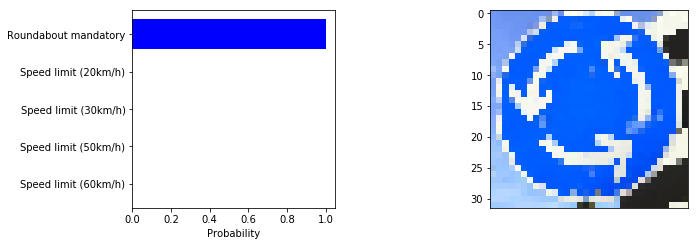

Top 5 Softmax Probabilities:
     Roundabout mandatory: 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (60km/h): 0.0


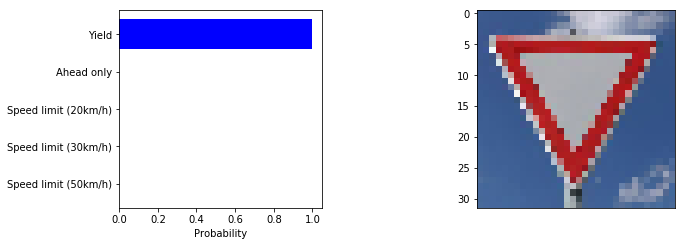

Top 5 Softmax Probabilities:
     Yield: 1.0
     Ahead only: 6.239e-34
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0


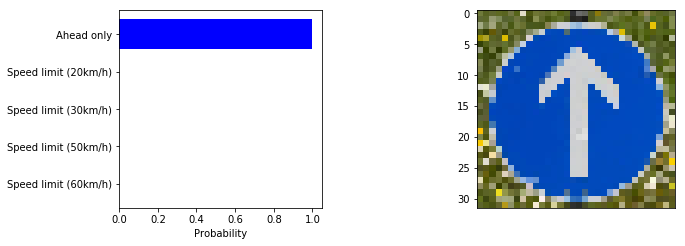

Top 5 Softmax Probabilities:
     Ahead only: 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (60km/h): 0.0


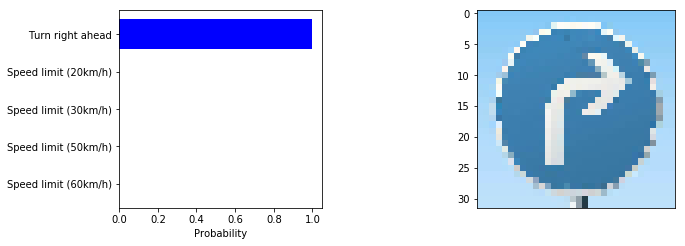

Top 5 Softmax Probabilities:
     Turn right ahead: 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (60km/h): 0.0


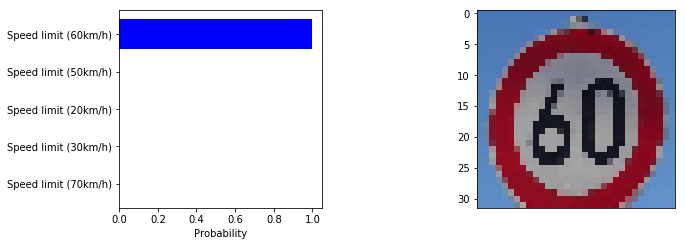

Top 5 Softmax Probabilities:
     Speed limit (60km/h): 1.0
     Speed limit (50km/h): 1.222e-34
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (70km/h): 0.0


In [32]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks'))
    for i in range(5):
        probs, top_n_names = view_web_with_preds(sess, egs[i])
        print('Top 5 Softmax Probabilities:')
        [print('     {}: {:.4}'.format(top_n_names[i], probs[i])) for i in range(5)]

## Crushing it! Now let's check a sign from the web that had low precision and recall on the test set, 'Dangerous Curve to Right'

Dangerous curve to the right:
     precision: 0.6698
     recall: 0.7172
     specificity: 0.997
INFO:tensorflow:Restoring parameters from checks/tsigns.ckpt


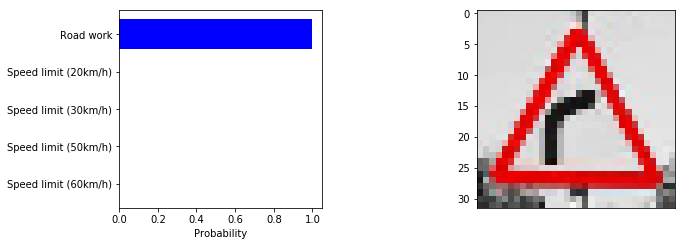

Top 5 Softmax Probabilities:
     Road work: 1.0
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0
     Speed limit (50km/h): 0.0
     Speed limit (60km/h): 0.0


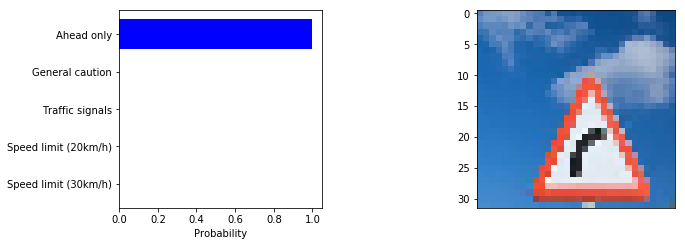

Top 5 Softmax Probabilities:
     Ahead only: 1.0
     General caution: 3.521e-22
     Traffic signals: 3.932e-26
     Speed limit (20km/h): 0.0
     Speed limit (30km/h): 0.0


In [33]:
print('{}:'.format(sign_names[20, 1]))
print('     precision: {:.4}'.format(precision[20]))
print('     recall: {:.4}'.format(recall[20]))
print('     specificity: {:.4}'.format(specificity[20]))

dang_curve_to_right = normalize(cv2.resize(mpimg.imread('traffic-signs-web/dangerous_curve_to_right.jpg'), dsize=(32,32)))
dang_curve_to_right2 = normalize(cv2.resize(mpimg.imread('traffic-signs-web/dangerous_curve_to_right2.jpg'), dsize=(32,32)))

with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks'))
    probs, top_n_names = view_web_with_preds(sess, dang_curve_to_right)
    print('Top 5 Softmax Probabilities:')
    [print('     {}: {:.4}'.format(top_n_names[i], probs[i])) for i in range(5)]
    
    probs, top_n_names = view_web_with_preds(sess, dang_curve_to_right2)
    print('Top 5 Softmax Probabilities:')
    [print('     {}: {:.4}'.format(top_n_names[i], probs[i])) for i in range(5)]

Well, at least the miss was predictable.

## Finally, have a look at the network's activation output to see how it's learning
## 1) On Roundabout Mandatory from web

INFO:tensorflow:Restoring parameters from checks/tsigns.ckpt


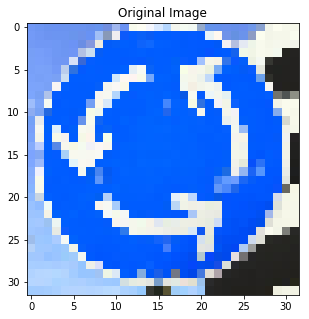

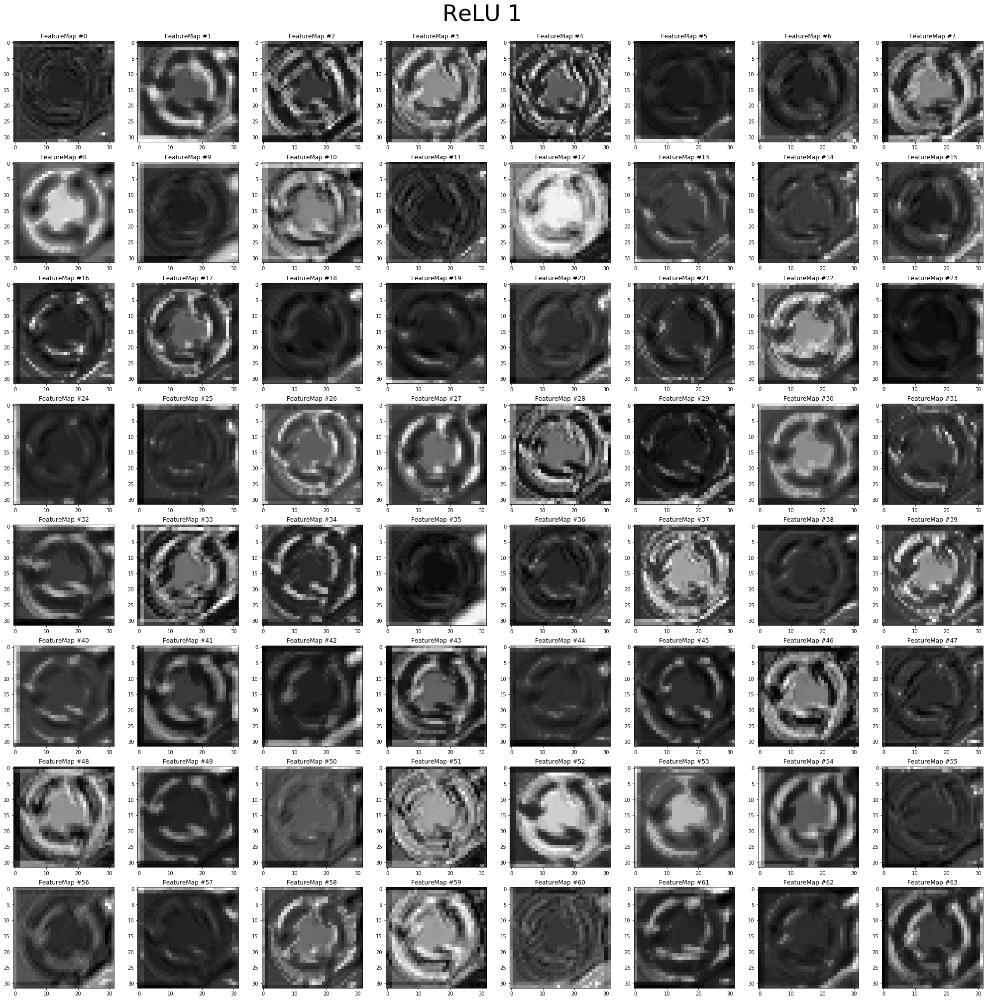

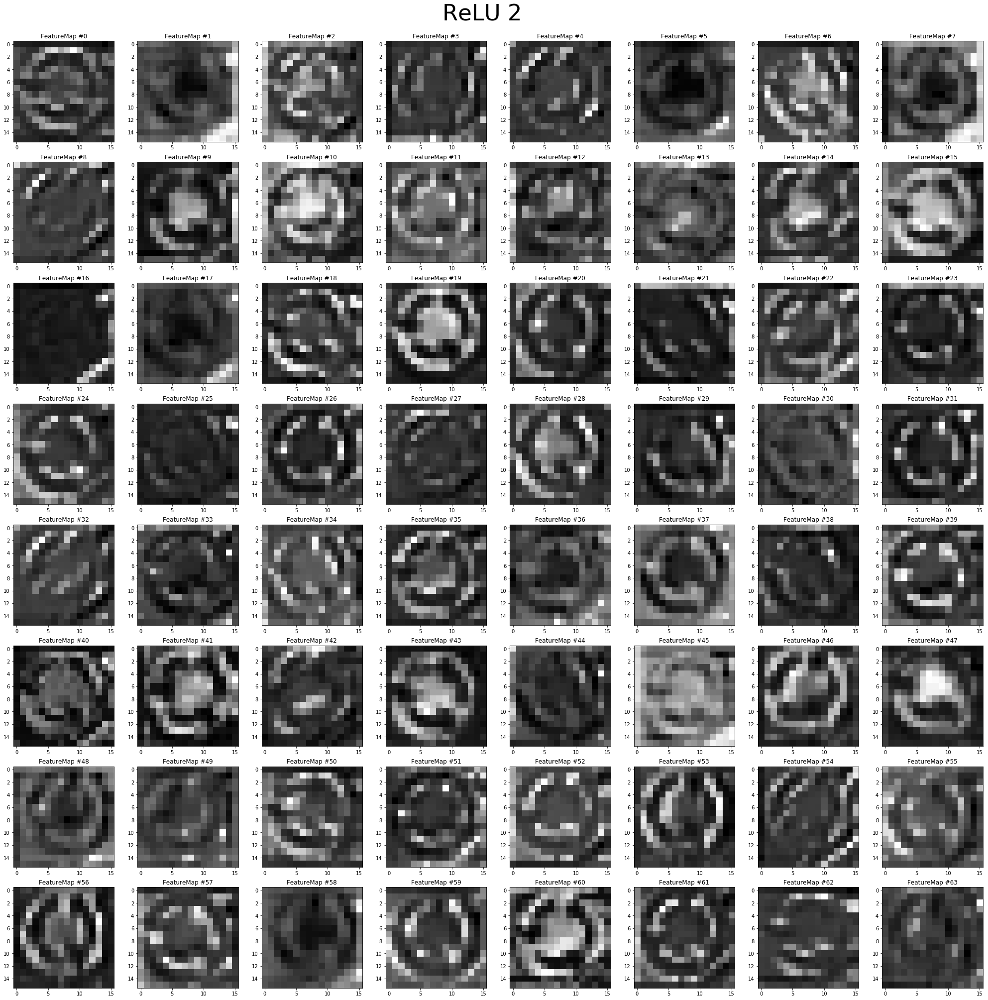

In [34]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks'))
    feed = {model.x: egs[0].reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    relu1, relu2 = sess.run([model.relu1, model.relu2], feed_dict=feed)
    
    plt.figure(figsize=(5,5))
    plt.imshow(egs[0])
    plt.title('Original Image')
    
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 1', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu1[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))
        
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 2', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu2[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))

## 2) On 60km/h from web

INFO:tensorflow:Restoring parameters from checks/tsigns.ckpt


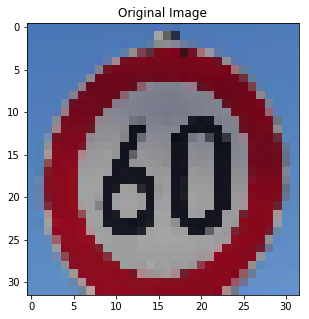

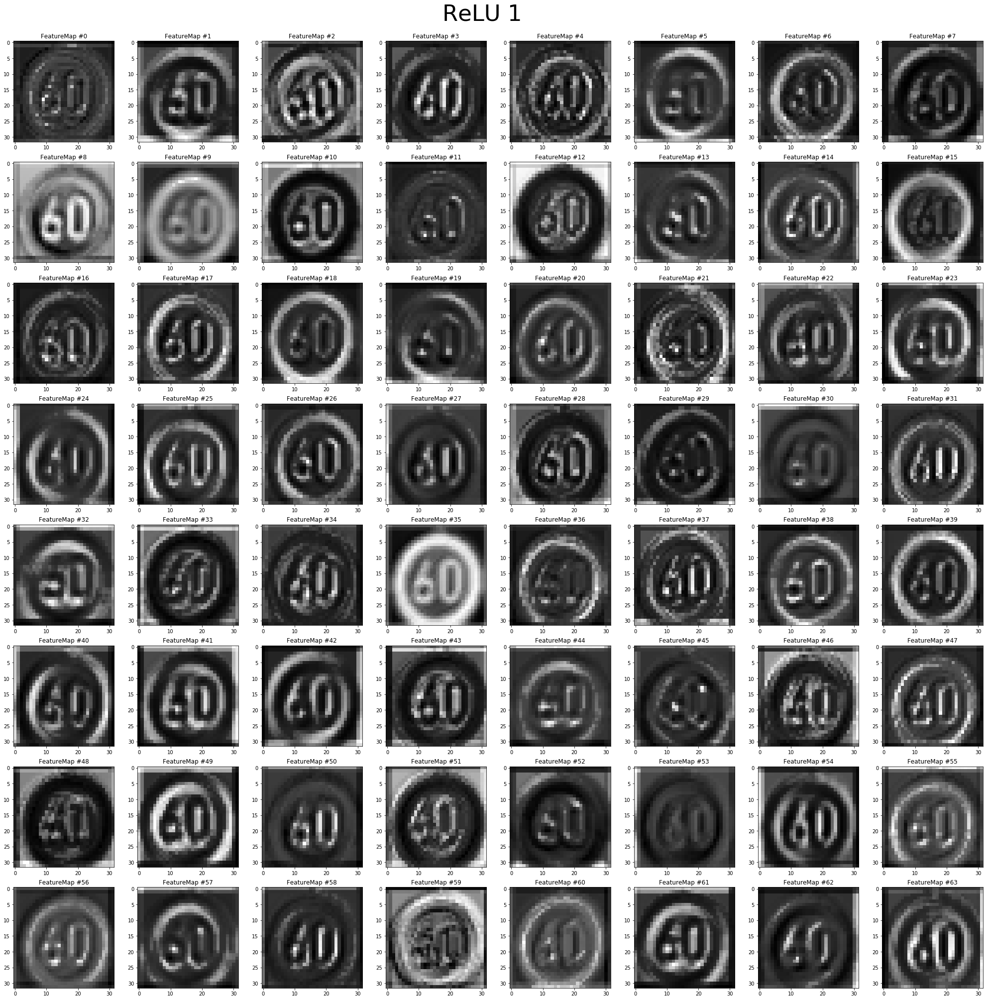

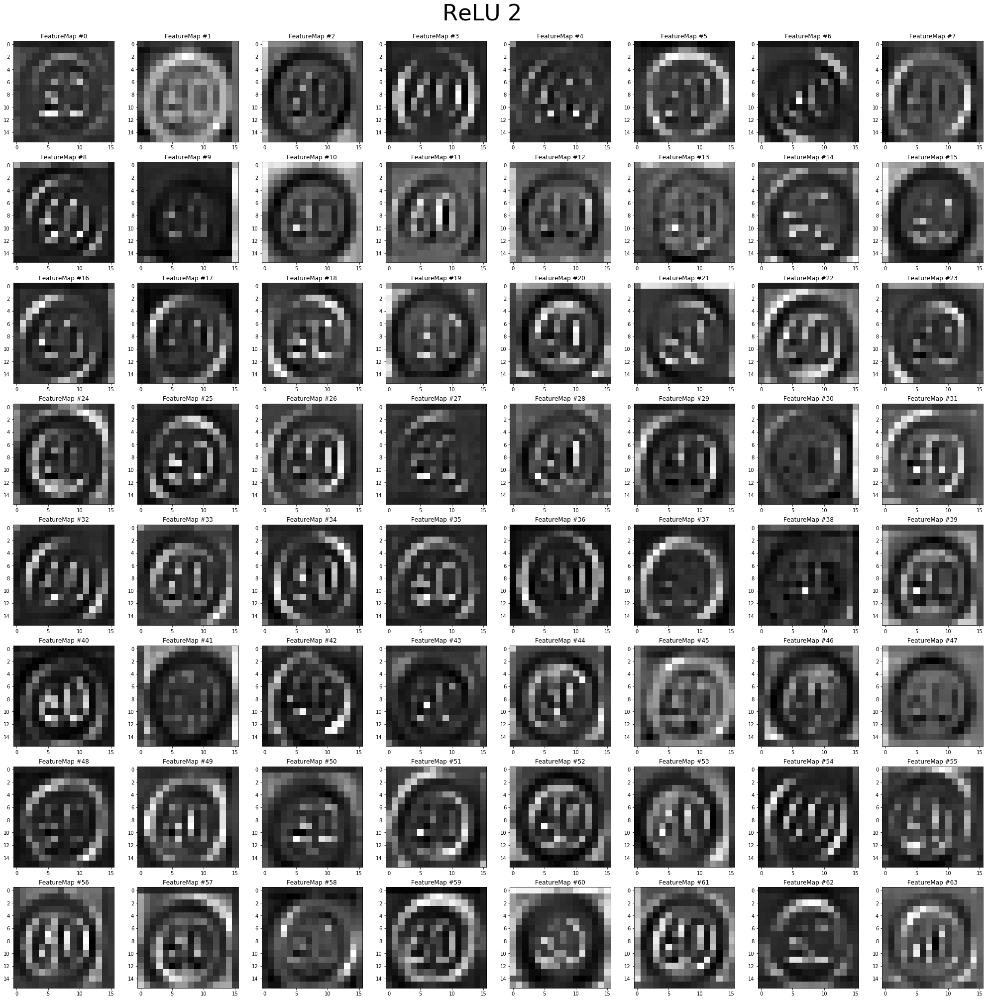

In [35]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks'))
    feed = {model.x: egs[-1].reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    relu1, relu2 = sess.run([model.relu1, model.relu2], feed_dict=feed)
    
    plt.figure(figsize=(5,5))
    plt.imshow(egs[-1])
    plt.title('Original Image')
    
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 1', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu1[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))
        
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 2', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu2[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))

## 3) On Dangerous Curve to Right from web

Keeping in mind how this sign had low precision and recall, notice how the network has trouble recognizing the relevant line that distinguishes it from other triangular street signs.

INFO:tensorflow:Restoring parameters from checks/tsigns.ckpt


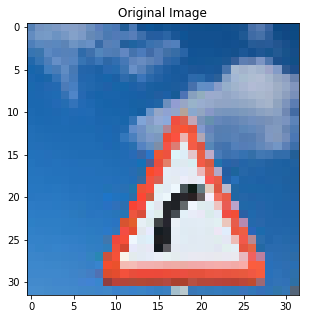

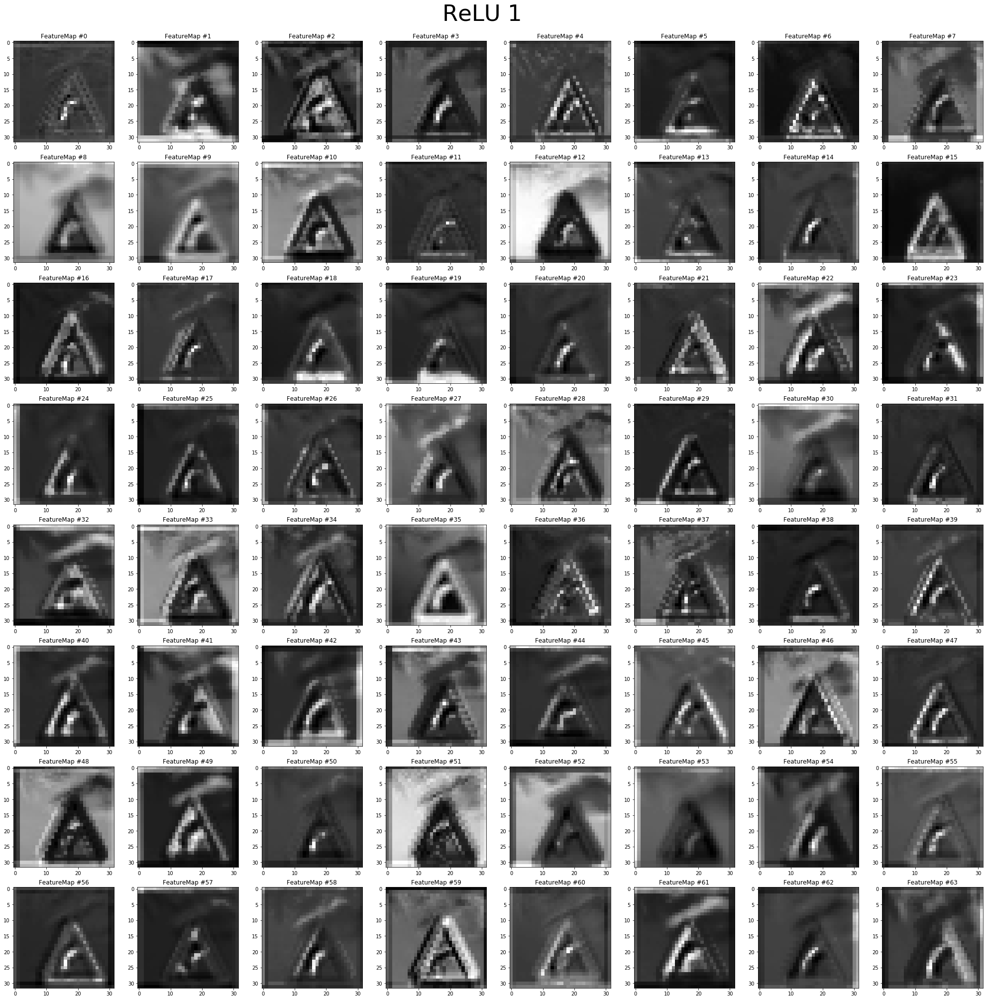

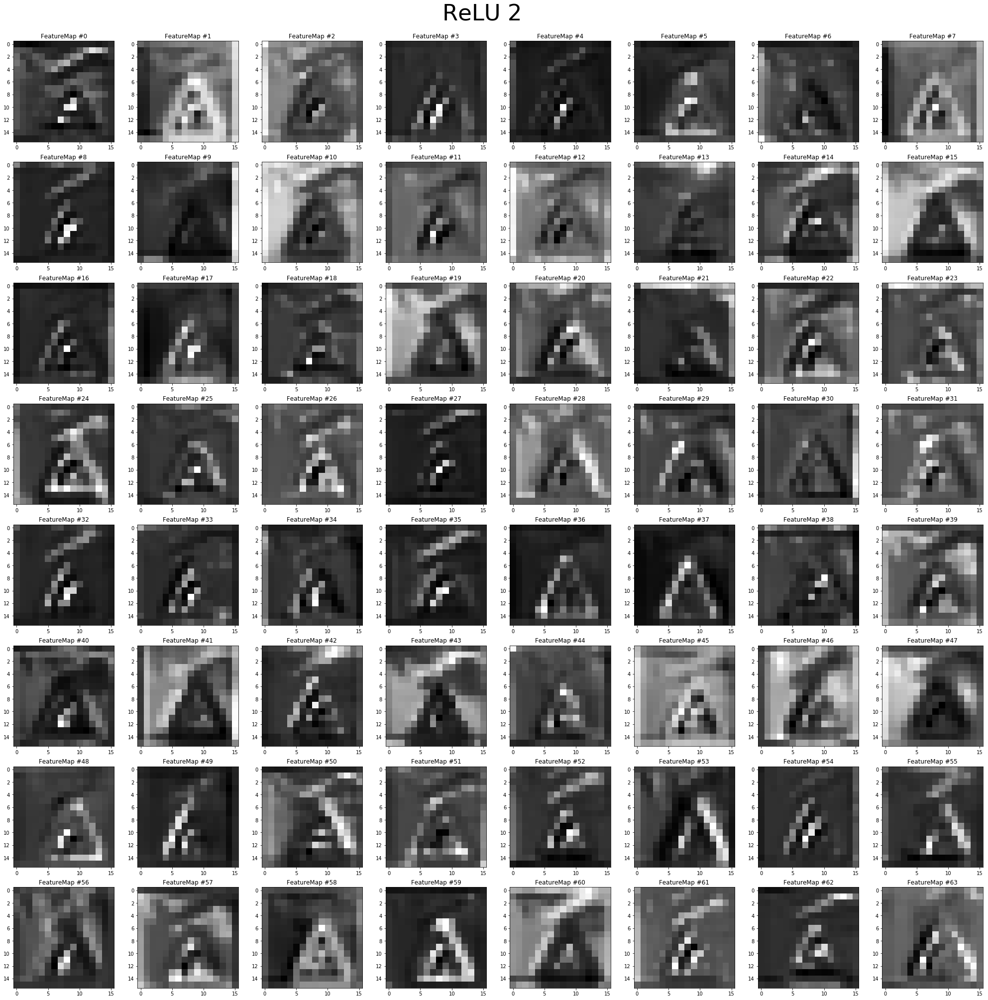

In [36]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks'))
    feed = {model.x: dang_curve_to_right2.reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    relu1, relu2 = sess.run([model.relu1, model.relu2], feed_dict=feed)
    
    plt.figure(figsize=(5,5))
    plt.imshow(dang_curve_to_right2)
    plt.title('Original Image')
    
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 1', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu1[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))
        
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 2', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu2[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))

## 4) On Van Gogh's Siesta
Because why not?

INFO:tensorflow:Restoring parameters from checks/tsigns.ckpt


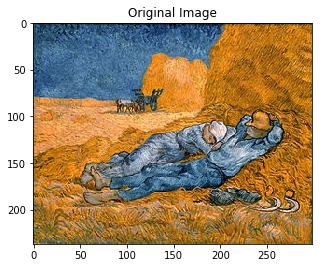

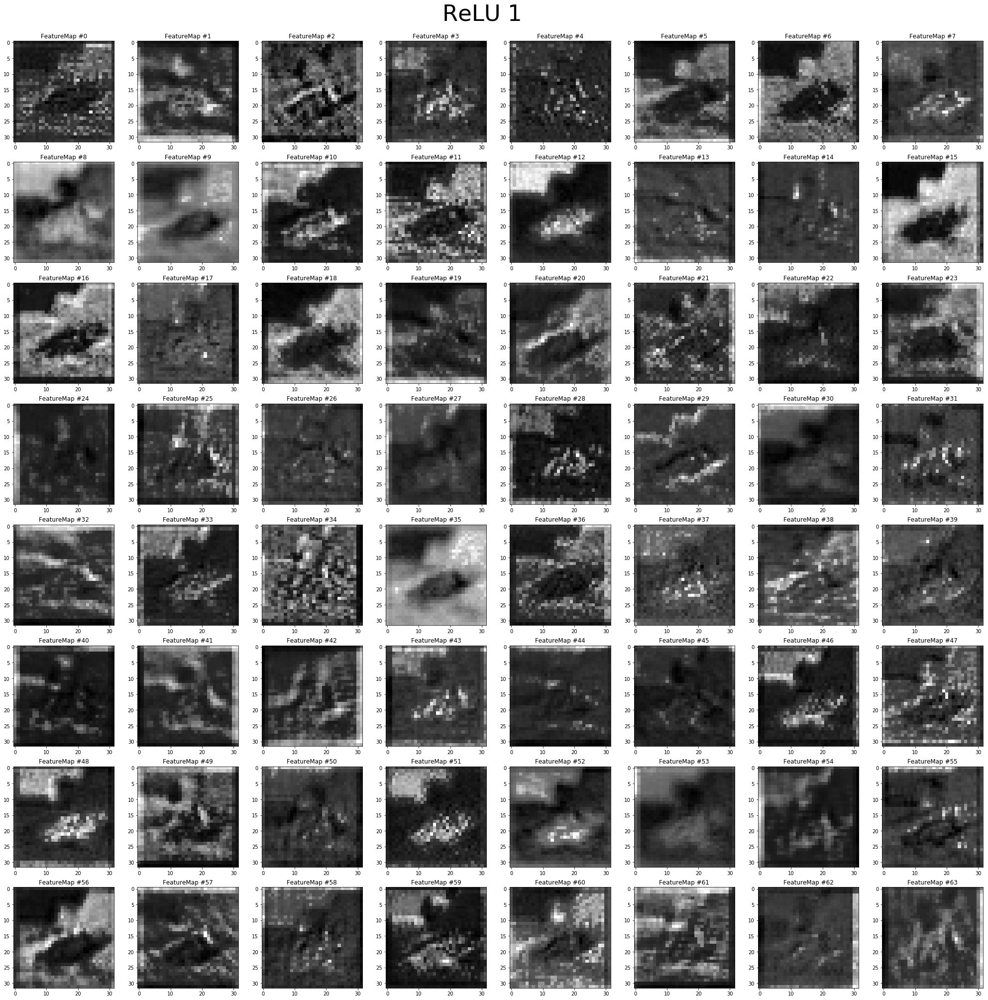

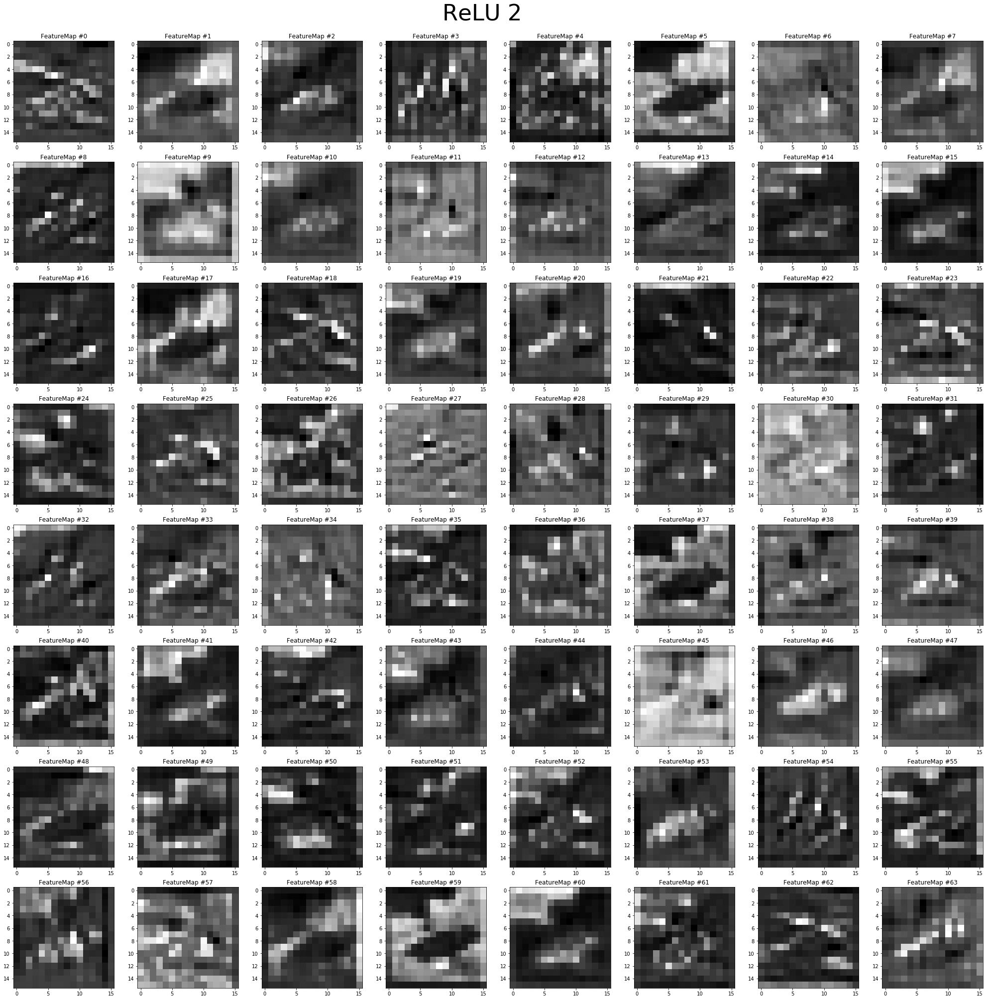

In [37]:
van_gogh = normalize(cv2.resize(mpimg.imread('traffic-signs-web/van_gogh.jpg'), dsize=(32,32)))
van_gogh_orig = mpimg.imread('traffic-signs-web/van_gogh.jpg')
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('checks'))
    feed = {model.x: van_gogh.reshape((1,32,32,-1)), 
            model.drop_rate: 0., 
            model.is_train: False}
    relu1, relu2 = sess.run([model.relu1, model.relu2], feed_dict=feed)
    
    plt.figure(figsize=(5,5))
    plt.imshow(van_gogh_orig)
    plt.title('Original Image')
    
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 1', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu1[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))
        
    plt.figure(figsize=(35,35))
    plt.suptitle('ReLU 2', fontsize=45, y=0.91)
    for i in range(64):
        plt.subplot(8,8,(i+1))
        plt.imshow(relu2[0, :, :, i], interpolation='nearest', cmap='gray')
        plt.title('FeatureMap #{}'.format(i))